<a href="https://colab.research.google.com/github/wg6872/TCDGNN/blob/main/implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Implementation
This notebook contains all the required code to replicate the experiments of the paper. If any code is inspired or used from other sources, there is a citation within an in-line comment.

**Important Note: The classification tasks only run on CPU instances, while the clustering tasks only run on GPU instances.**

## Required Imports (May take a while)

In [ ]:
import os
import sys
from collections import Counter
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import scipy.sparse as sp
from scipy.sparse import coo_matrix, csr_matrix, hstack

import matplotlib.pyplot as plt
import seaborn as sns

# Ignore warnings about torchaudio and torchvision
!pip install torch==2.8.0
import torch
import networkx as nx
!pip install cdlib
from cdlib import algorithms, viz, NodeClustering

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, ConfusionMatrixDisplay, roc_curve, auc, RocCurveDisplay, roc_auc_score, PrecisionRecallDisplay
from sklearn.preprocessing import normalize

os.environ["TORCH"] = torch.__version__
print(torch.__version__)
!pip install torch_geometric

!git clone https://github.com/shchur/overlapping-community-detection.git
!pip install -e /content/overlapping-community-detection/
# https://stackoverflow.com/questions/52681405/how-can-i-import-custom-modules-from-a-github-repository-in-google-colab
sys.path.insert(0,'/content/overlapping-community-detection/')
import torch_geometric as pg
from torch_geometric.data import InMemoryDataset, download_url
from torch_geometric.io import read_txt_array
from torch_geometric.transforms import BaseTransform
from torch_geometric.utils import coalesce, to_scipy_sparse_matrix
import nocd

SEED = 42
torch.manual_seed(SEED)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.9/887.9 MB 809.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 84.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.2/288.2 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.4/322.4 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.3/39.3 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90

## Import and Describe Dataset
**Important Instructions:** Initially, `pg.datasets.UPFD` was used to download the dataset from the PyTorch-Geometric package, but we now have to host it locally. To obtain the dataset files, download them from the project [GitHub repository](https://github.com/wg6872/TCDGNN) or [my personal Google Drive](https://drive.google.com/drive/folders/1ktNy2wwE6Rm4AZhrO8kJ_QllIY85mHsw?usp=sharing). Then, upload the folder contents of "politifact" and "gossipcop" to "/content/data/politifact/politifact/raw/" and "/content/data/gossipcop/gossipcop/raw/". If a particular folder doesn't appear at first, re-run the code block after uploading the previously missing files.

In [ ]:
politifact_train = pg.datasets.UPFD(root="/content/data/politifact", name="politifact", feature="profile", split="train", pre_transform=pg.transforms.ToUndirected())
politifact_val = pg.datasets.UPFD(root="/content/data/politifact", name="politifact", feature="profile", split="val", pre_transform=pg.transforms.ToUndirected())
politifact_test = pg.datasets.UPFD(root="/content/data/politifact", name="politifact", feature="profile", split="test", pre_transform=pg.transforms.ToUndirected())

politifact_training_len = len(politifact_train.x)
politifact_validation_len = len(politifact_val.x)
politifact_test_len = len(politifact_test.x)

gossipcop_train = pg.datasets.UPFD(root="/content/data/gossipcop", name="gossipcop", feature="profile", split="train", pre_transform=pg.transforms.ToUndirected())
gossipcop_val = pg.datasets.UPFD(root="/content/data/gossipcop", name="gossipcop", feature="profile", split="val", pre_transform=pg.transforms.ToUndirected())
gossipcop_test = pg.datasets.UPFD(root="/content/data/gossipcop", name="gossipcop", feature="profile", split="test", pre_transform=pg.transforms.ToUndirected())

gossipcop_training_len = len(gossipcop_train.x)
gossipcop_validation_len = len(gossipcop_val.x)
gossipcop_test_len = len(gossipcop_test.x)

features = [
    "Verified?",
    "Enable geo-spatial positioning",
    "Followers count",
    "Friends count",
    "Status count",
    "Favorite count",
    "Number of lists",
    "Created time",
    "Number of words in desc",
    "Number of words in name"
    ]

# Code inspired by PyTorch-Geometric UPFD documentation: https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.datasets.UPFD.html?highlight=upfd#torch_geometric.datasets.UPFD

Processing...
Done!


## Optional Dataset Visualization Methods
The code block below contains modular functions adapted from the exploratory data analysis notebook. It can be used to make temporary visualizations of the dataset.

In [ ]:
def summarize_dataset(dataset):
  # Code inspired by PyTorch-Geometric Node Classification Example Notebook: https://colab.research.google.com/drive/14OvFnAXggxB8vM4e8vSURUp1TaKnovzX?usp=sharing#scrollTo=imGrKO5YH11-
  print(f"Dataset: {dataset} (Train)")
  print(f"Num graphs: {len(dataset)}")
  print(f"Num features: {dataset.num_features}")
  print()

  graph_0 = dataset[0]
  print(f"Summary of first graph: {graph_0}")
  print(f"Number of nodes: {graph_0.num_nodes}")
  print(f"Number of edges: {graph_0.num_edges}")
  print(f"Average node degree: {graph_0.num_edges / graph_0.num_nodes:.2f}")
  print(f"Has isolated nodes: {graph_0.has_isolated_nodes()}")
  print(f"Has self-loops: {graph_0.has_self_loops()}")
  print(f"Is undirected: {graph_0.is_undirected()}")


def visualize_dataset(timestamped_train_dataset, timestamps, newsNodes, figure_dim, title):
  # draw_networkx documentation: https://networkx.org/documentation/stable/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html
  graph = pg.utils.to_networkx(timestamped_train_dataset)
  plt.figure(figsize=(figure_dim,figure_dim))
  plt.title(title)
  CMAP = plt.get_cmap("viridis")

  normalized_timestamps = (timestamps[1] - torch.min(timestamps[1])) / (torch.max(timestamps[1]) - torch.min(timestamps[1]))
  graph_news = []
  for idx in newsNodes:
    if idx < len(timestamped_train_dataset.x):
      graph_news.append(idx)
  normalized_timestamps[graph_news] = 0

  nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED, k=50), node_color=CMAP(normalized_timestamps), with_labels=False)
  plt.show()

  return normalized_timestamps


def visualize_graphs(timestamped_train_dataset, timestamps, normalized_timestamps, figure_dim, title, num_graphs):
  visual = timestamped_train_dataset[:num_graphs]
  visual = pg.data.Data(x=visual.x, edge_index=visual.edge_index, y=visual.y, timestamps=timestamps[:len(visual.x)])
  graph = pg.utils.to_networkx(visual)
  CMAP = plt.get_cmap("viridis")
  plt.figure(figsize=(figure_dim, figure_dim))
  plt.title(title)
  nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED, k=2), node_color=CMAP(normalized_timestamps[:len(visual.x)]), with_labels=False)
  plt.show()


def visualize_violin(timestamps, figure_dim, title, yticks, ylabels):
  # Consulted Matplotlib documentation
  violin_plot_data = timestamps[1]
  plt.figure(figsize=(figure_dim, figure_dim))
  plt.title(title)
  plt.ylabel("Timestamp of Interaction [Month, Year]")
  # Convert using online tool
  plt.yticks(ticks=yticks, labels=ylabels)
  plt.xticks([])
  plt.xlabel("Interaction Density [Num Interactions]")
  plt.violinplot(violin_plot_data, showmedians=True, quantiles=[0.25, 0.50, 0.75])
  plt.show()


def visualize_pca(data, newsNodes, title):
  pca = PCA(n_components=2)
  user_embeddings = [data.x[i] for i in range(len(data.x)) if i not in newsNodes]
  embeddings = pca.fit_transform(user_embeddings)
  embeddings_x = [embedding[0] for embedding in embeddings]
  embeddings_y = [embedding[1] for embedding in embeddings]

  plt.figure(figsize=(9, 9))
  plt.title(title)
  plt.xlabel("PCA Dimension One")
  plt.ylabel("PCA Dimension Two")
  plt.scatter(embeddings_x, embeddings_y)
  plt.show()


def visualize_pie(data, title):
  # Consulted https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.pie.html and https://matplotlib.org/stable/users/explain/text/text_props.html
  news_freq = Counter(data.y.tolist())
  news_freq = list(news_freq.values())

  plt.figure(figsize=(9, 9))
  plt.title(title)
  plt.pie(news_freq,
          labels=[f"Fake ({round(news_freq[0] / (news_freq[0] + news_freq[1]), 2)})",
                  f"Real ({round(news_freq[1]  / (news_freq[0] + news_freq[1]), 2)})"],
          labeldistance=0.5,
          textprops={"size": "x-large"})
  plt.show()


def visualize_corr(data, title):
  # Consulted https://stackoverflow.com/questions/39409866/correlation-heatmap and https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html
  heatmap = pd.DataFrame(data.x).corr()
  plt.figure(figsize=(12, 12))
  plt.title(title)
  sns.heatmap(heatmap, annot=True, fmt=".3f")

  # Must hardcode the features for larger embeddings
  plt.yticks(ticks=np.arange(10).tolist(),
            labels=["Verified", "Enable Location", "# Followers", "# Friends", "Status Count", "Favorite Count", "# Lists", "Acc Created", "Bio Length", "Name Length"],
            rotation=0)
  plt.xticks(ticks=np.arange(10).tolist(),
            labels=["Verified", "Enable Location", "# Followers", "# Friends", "Status Count", "Favorite Count", "# Lists", "Acc Created", "Bio Length", "Name Length"],
            rotation=90)
  plt.show()

## Dataset Processing Methods

The following code block includes the timestamp mapping, time span creation, and dataset masking helper functions.

In [ ]:
def dataset_timestamps(timestamp_pickle_path):
  timestamps = pd.read_pickle(timestamp_pickle_path)
  newsNodes = []
  for node in timestamps:
    # Because the timestamps are ordered, the previous node with a missing value should be at most the timestamp of the next node (impute rule)
    # The nodes with missing values are news nodes, according to the GNN-FakeNews Repo
    if timestamps[node] == "":
      newsNodes.append(node)
      timestamps[node] = timestamps[node + 1] if (node + 1) in timestamps else timestamps[node - 1]

# Node indices, Timestamp value, News Node indices
  return list(timestamps.keys()), list(timestamps.values()), newsNodes

# https://stackoverflow.com/questions/77369606/how-to-add-a-new-attribute-to-a-torch-geometric-data-data-object-element
class Add_Timestamps(BaseTransform):
    def __init__(self, idx, timestamp_vals):
        self.idx = idx
        self.timestamp_vals = timestamp_vals
    def forward(self, data):
        node_feature = []
        data.t = self.timestamp_vals[self.idx:(self.idx + len(data.x))]
        self.idx += len(data.x)
        return data

class TimeMask(BaseTransform):
  def __init__(self, start_time, end_time):
    self.start_time = start_time
    self.end_time = end_time

  def forward(self, data):
    # Mask code inspired by a code example from ChatGPT (Approved by Professor Li)
    t = np.array(data.t)
    mask = (t >= self.start_time) & (t <= self.end_time)

    valid_nodes = np.where(mask)[0]

    if len(valid_nodes) == 0:
      empty_graph = pg.data.Data()
      empty_graph.x = torch.empty((0, len(data.x[0])))
      empty_graph.edge_index = torch.empty((2, 0))
      empty_graph.y = data.y
      empty_graph.t = torch.empty((0,))

      return empty_graph

    data.x = data.x[valid_nodes]
    data.t = t[valid_nodes]

    # https://github.com/pyg-team/pytorch_geometric/discussions/6644
    valid_nodes = torch.tensor(valid_nodes)
    new_edge_index, _ = pg.utils.subgraph(edge_index=data.edge_index, subset=valid_nodes, relabel_nodes=True)

    return pg.data.Data(x=data.x, edge_index=new_edge_index, y=data.y, t=data.t)

def timespans(timestamps, years):
  WINDOW_SIZE = timedelta(days=years*365)

  sorted_timestamps = np.sort(timestamps)
  sorted_timestamps = [datetime.fromtimestamp(timestamp) for timestamp in sorted_timestamps]
  start = sorted_timestamps[0]
  end = sorted_timestamps[-1]

  windows = []
  current_start = start

  while current_start <= end:
    current_end = current_start + WINDOW_SIZE
    windows.append((current_start.timestamp(), current_end.timestamp()))
    current_start = current_end

  return windows

## Process Dataset

The code blocks below require the time mapping files, which may be accessed the same way as the dataset components.

In [ ]:
politifact_timestamp_nodes, politifact_timestamp_vals, politifact_newsNodes = dataset_timestamps("/content/data/politifact/pol_id_time_mapping.pkl")
politifact_training_timestamps = torch.tensor((politifact_timestamp_nodes[:politifact_training_len], politifact_timestamp_vals[:politifact_training_len]))
politifact_timestamps = torch.tensor((politifact_timestamp_nodes, politifact_timestamp_vals))

politifact_windows = timespans(politifact_timestamp_vals[:politifact_training_len], 4)
for i in politifact_windows:
  print(f'Start: {i[0]}, End: {i[1]}')

Start: 1199986355.0, End: 1326130355.0
Start: 1326130355.0, End: 1452274355.0
Start: 1452274355.0, End: 1578418355.0


In [ ]:
gossipcop_timestamp_nodes, gossipcop_timestamp_vals, gossipcop_newNodes = dataset_timestamps("/content/data/gossipcop/gos_id_time_mapping.pkl")
gossipcop_training_timestamps = torch.tensor((gossipcop_timestamp_nodes[:gossipcop_training_len], gossipcop_timestamp_vals[:gossipcop_training_len]))
gossipcop_timestamps = torch.tensor((gossipcop_timestamp_nodes, gossipcop_timestamp_vals))

gossipcop_windows = timespans(gossipcop_timestamp_vals[:gossipcop_training_len], 4)
for i in gossipcop_windows:
  print(f'Start: {i[0]}, End: {i[1]}')

Start: 1236634792.0, End: 1362778792.0
Start: 1362778792.0, End: 1488922792.0
Start: 1488922792.0, End: 1615066792.0


## Model Definition, Training, & Evaluation Pipeline

The set of experiments in the paper are included below. They are split first by dataset and then by task.

## PolitiFact

### [GNN, Use CPU] Graph Classification using Native Dataset (Not-Temporal)

In [ ]:
# Using optimal hyperparameters from https://github.com/safe-graph/GNN-FakeNews/blob/main/hyper_parameters.md

train_loader = pg.loader.DataLoader(politifact_train, batch_size=128, shuffle=True)
val_loader = pg.loader.DataLoader(politifact_val, batch_size=128, shuffle=False)
test_loader = pg.loader.DataLoader(politifact_test, batch_size=128, shuffle=False)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = nocd.nn.GCN(politifact_train[0].x.shape[1], [128], 2).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = torch.nn.CrossEntropyLoss()
NUM_EPOCHS = 60
NUM_FEATURES = 10
NUM_CLASSES = 2

# Training loop inspired by official PyG Graph Classification GCN and upfd.py from https://github.com/pyg-team/pytorch_geometric/blob/master/examples/upfd.py
def train():
    model.train()

    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()

        # Adjacency computation is repeated because it cannot be stored in memory
        graph = pg.utils.to_networkx(data)
        adj = nx.adjacency_matrix(graph)
        adj = coo_matrix(adj)

        # Consulted: https://discuss.pytorch.org/t/creating-a-sparse-tensor-from-csr-matrix/13658/4
        values = adj.data
        indices = np.vstack((adj.row, adj.col))
        adj = torch.sparse.FloatTensor(torch.LongTensor(indices), torch.FloatTensor(values), torch.Size(adj.shape)).to_dense()

        # The GCN is made for node classification, so we pool the predictions for each node
        node_outputs = model(data.x, adj)
        output = pg.nn.global_mean_pool(node_outputs, data.batch)
        loss = criterion(output, data.y)

        loss.backward()
        optimizer.step()
        total_loss += float(loss) * data.num_graphs

    return total_loss / len(train_loader.dataset)

# Evaluation loop inspired by the official PyG Graph Classification GCN
def test(loader, holdout=False):
    model.eval()
    outputs = []
    ground_truth = []
    total_loss = 0
    with torch.no_grad():
        for data in loader:
            data = data.to(device)

            # Adjacency computation is repeated because it cannot be stored in memory
            graph = pg.utils.to_networkx(data)
            adj = nx.adjacency_matrix(graph)
            adj = coo_matrix(adj)

            # Consulted: https://discuss.pytorch.org/t/creating-a-sparse-tensor-from-csr-matrix/13658/4
            values = adj.data
            indices = np.vstack((adj.row, adj.col))
            adj = torch.sparse.FloatTensor(torch.LongTensor(indices), torch.FloatTensor(values), torch.Size(adj.shape)).to_dense()

            # The GCN is made for node classification, so we pool the predictions for each node
            node_outputs = model(data.x, adj)
            output = pg.nn.global_mean_pool(node_outputs, data.batch)
            loss = criterion(output, data.y)
            total_loss += float(loss) * data.num_graphs


            prediction = output.argmax(dim=1)

            outputs.append(prediction.cpu())
            ground_truth.append(data.y.cpu())


    outputs = torch.cat(outputs)
    ground_truth = torch.cat(ground_truth)
    avg_loss = total_loss / len(loader.dataset)

    accuracy = accuracy_score(ground_truth.numpy(), outputs.numpy())

    if holdout:
      return accuracy, avg_loss, outputs, ground_truth
    else:
      return accuracy, avg_loss

# Inspired by upfd.py from https://github.com/pyg-team/pytorch_geometric/blob/master/examples/upfd.py
train_loss_list = []
val_loss_list = []
train_acc_per_epoch = []
val_acc_per_epoch = []
for epoch in range(NUM_EPOCHS):
    loss = train()
    train_loss_list.append(loss)

    train_acc, _ = test(train_loader, holdout=False)
    train_acc_per_epoch.append(train_acc)

    val_acc, val_loss = test(val_loader, holdout=False)
    val_loss_list.append(val_loss)
    val_acc_per_epoch.append(val_acc)

    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Train: {train_acc:.4f}, '
          f'Val: {val_acc:.4f}')

test_acc, _, pred, gt = test(test_loader, holdout=True)
test_precision = precision_score(gt, pred)
test_recall = recall_score(gt, pred)
test_f1 = f1_score(gt, pred)
print(f'Test Acc of Final Model: {test_acc:.4f}')
print(f'Test Precision of Final Model: {test_precision:.4f}')
print(f'Test Recall of Final Model: {test_recall:.4f}')
print(f'Test F1 Score of Final Model: {test_f1:.4f}')

Epoch: 00, Loss: 1.9213, Train: 0.5806, Val: 0.4194
Epoch: 01, Loss: 2.0570, Train: 0.5806, Val: 0.4194
Epoch: 02, Loss: 1.7766, Train: 0.5645, Val: 0.3871
Epoch: 03, Loss: 1.4686, Train: 0.5484, Val: 0.4194
Epoch: 04, Loss: 2.2007, Train: 0.5000, Val: 0.3871
Epoch: 05, Loss: 2.7937, Train: 0.4194, Val: 0.2903
Epoch: 06, Loss: 2.1122, Train: 0.2742, Val: 0.3548
Epoch: 07, Loss: 1.7252, Train: 0.3387, Val: 0.4516
Epoch: 08, Loss: 0.8271, Train: 0.3710, Val: 0.5161
Epoch: 09, Loss: 1.3399, Train: 0.4355, Val: 0.5484
Epoch: 10, Loss: 1.4018, Train: 0.4516, Val: 0.5806
Epoch: 11, Loss: 1.6156, Train: 0.4516, Val: 0.5806
Epoch: 12, Loss: 1.5524, Train: 0.5000, Val: 0.6452
Epoch: 13, Loss: 2.0005, Train: 0.5323, Val: 0.6774
Epoch: 14, Loss: 1.4139, Train: 0.6129, Val: 0.6452
Epoch: 15, Loss: 1.3491, Train: 0.6774, Val: 0.5806
Epoch: 16, Loss: 1.5244, Train: 0.6129, Val: 0.5806
Epoch: 17, Loss: 1.3256, Train: 0.6129, Val: 0.5484
Epoch: 18, Loss: 0.9690, Train: 0.6290, Val: 0.5161
Epoch: 19, L

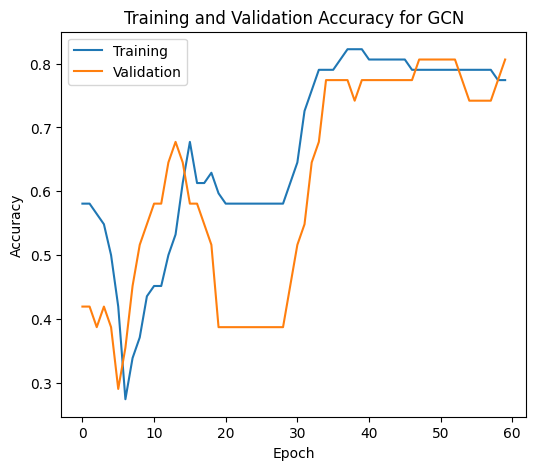

In [ ]:
# PolitiFact GNN Classifier Accuracy Plot
plt.figure(figsize=(6,5))
plt.title("Training and Validation Accuracy for GCN")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.plot(np.arange(len(train_acc_per_epoch)), train_acc_per_epoch, label="Training")
plt.plot(np.arange(len(val_acc_per_epoch)), val_acc_per_epoch, label="Validation")
plt.legend()
plt.show()

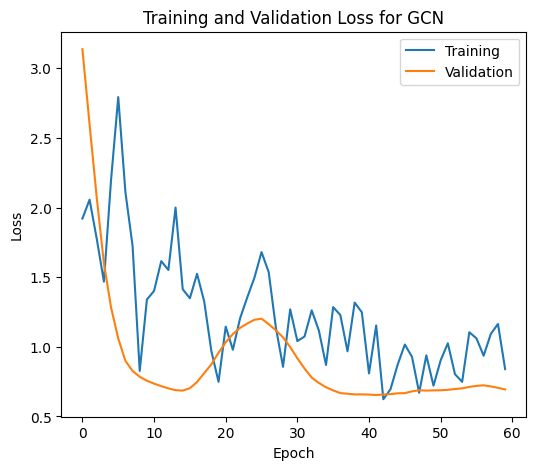

In [ ]:
# PolitiFact GNN Classifier Loss Plot
plt.figure(figsize=(6, 5))
plt.title("Training and Validation Loss for GCN")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.plot(np.arange(len(train_loss_list)), train_loss_list, label="Training")
plt.plot(np.arange(len(val_loss_list)), val_loss_list, label="Validation")
plt.legend()
plt.show()

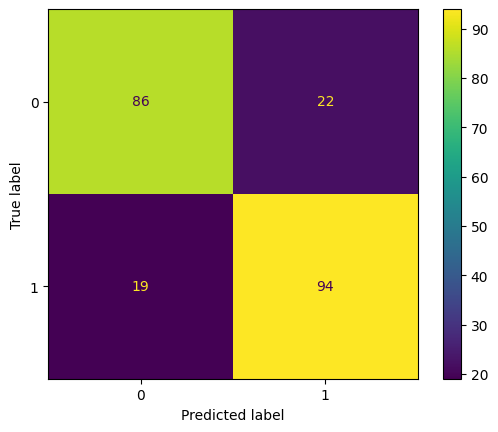

In [ ]:
# PolitiFact GNN Classifier Confusion Matrix
ConfusionMatrixDisplay.from_predictions(torch.cat([truth.view(-1) for truth in gt]).tolist(), torch.cat([output.view(-1) for output in pred]).tolist())
plt.show()

Area under ROC Curve: 0.8141


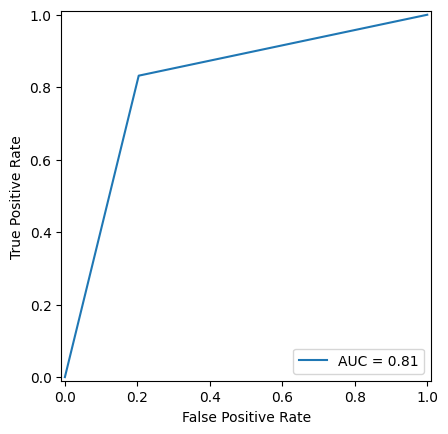

In [ ]:
# PolitiFact GNN Classifier ROC Plot
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions
fpr, tpr, thresholds = roc_curve(gt, pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()
print(f'Area under ROC Curve: {roc_auc_score(gt, pred):.4f}')

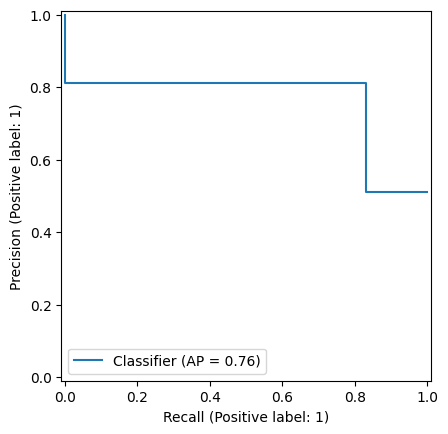

In [ ]:
# PolitiFact GNN Classifier Precision-Recall Plot
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.PrecisionRecallDisplay.html#sklearn.metrics.PrecisionRecallDisplay.from_predictions
PrecisionRecallDisplay.from_predictions(gt, pred)
plt.show()

### [KNN, Use CPU] Graph Classification using Native Dataset (Non-Temporal)

In [ ]:
# Politifact K-Neighbors Hyperparameter Tuning via https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html#sklearn.model_selection.GridSearchCV
train_loader = pg.loader.DataLoader(politifact_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(politifact_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(politifact_test, batch_size=1, shuffle=False)

politifact_train_vectors = []
train_labels = []
politifact_test_vectors = []
test_labels = []

for i in train_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  politifact_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

parameters = {
    'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute'),
    'n_neighbors': np.arange(1, 21),
    'p': [1, 2, 3],
    'weights': ('uniform', 'distance')
}

# GridSearchCV does cross-validation for us on the training data, so we combine train & val
model = KNeighborsClassifier()
clf = GridSearchCV(estimator=model, cv=10, param_grid=parameters)

clf.fit(politifact_train_vectors, train_labels)
clf.best_params_

{'algorithm': 'auto', 'n_neighbors': np.int64(5), 'p': 3, 'weights': 'uniform'}

In [ ]:
train_loader = pg.loader.DataLoader(politifact_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(politifact_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(politifact_test, batch_size=1, shuffle=False)

ALGORITHM = clf.best_params_["algorithm"] # "auto"
NUM_NEIGHBORS = clf.best_params_["n_neighbors"] # 5
P = clf.best_params_["p"] # 3
WEIGHTS = clf.best_params_["weights"] # "uniform"

politifact_train_vectors = []
train_labels = []
politifact_test_vectors = []
test_labels = []

for i in train_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  politifact_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

neigh = KNeighborsClassifier(algorithm=ALGORITHM, n_neighbors=NUM_NEIGHBORS, p=P, weights=WEIGHTS)
neigh.fit(politifact_train_vectors, train_labels)

KNN_train_acc = neigh.score(politifact_train_vectors, train_labels)
KNN_test_acc = neigh.score(politifact_test_vectors, test_labels)
KNN_pred = neigh.predict(politifact_test_vectors)

print(f'Train Acc: {KNN_train_acc:.4f}')
print()
print(f'Test Acc: {KNN_test_acc:.4f}')

KNN_test_precision = precision_score(test_labels, KNN_pred)
KNN_test_recall = recall_score(test_labels, KNN_pred)
KNN_test_f1 = f1_score(test_labels, KNN_pred)
print(f'Test Precision: {KNN_test_precision:.4f}')
print(f'Test Recall: {KNN_test_recall:.4f}')
print(f'Test F1 Score: {KNN_test_f1:.4f}')

Train Acc: 0.8387

Test Acc: 0.7602
Test Precision: 0.7273
Test Recall: 0.8496
Test F1 Score: 0.7837


In [ ]:
# PolitiFact K-Neighbors Feature Importance
train_loader = pg.loader.DataLoader(politifact_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(politifact_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(politifact_test, batch_size=1, shuffle=False)

ALGORITHM = clf.best_params_["algorithm"] # "auto"
NUM_NEIGHBORS = clf.best_params_["n_neighbors"] # 5
P = clf.best_params_["p"] # 3
WEIGHTS = clf.best_params_["weights"] # "uniform"

politifact_train_vectors = []
train_labels = []
politifact_test_vectors = []
test_labels = []

for i in train_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  politifact_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  politifact_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

neigh = KNeighborsClassifier(algorithm=ALGORITHM, n_neighbors=NUM_NEIGHBORS, p=P, weights=WEIGHTS)
neigh.fit(politifact_train_vectors, train_labels)

# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html
results = permutation_importance(neigh, politifact_train_vectors, train_labels, scoring="accuracy")
importance = results.importances_mean
features = ["Verified?", "Enable geo-spatial positioning", "Followers count", "Friends count", "Status count", "Favorite count", "Number of lists", "Created time", "Number of words in desc", "Number of words in name"]
for i in range(10):
  print(f"{features[i]}: {importance[i]}")

Verified?: 0.12688172043010754
Enable geo-spatial positioning: 0.06881720430107532
Followers count: 0.0
Friends count: 0.0
Status count: 0.0
Favorite count: 0.0064516129032258
Number of lists: 0.0
Created time: 0.2537634408602151
Number of words in desc: -0.010752688172043001
Number of words in name: -0.0064516129032258


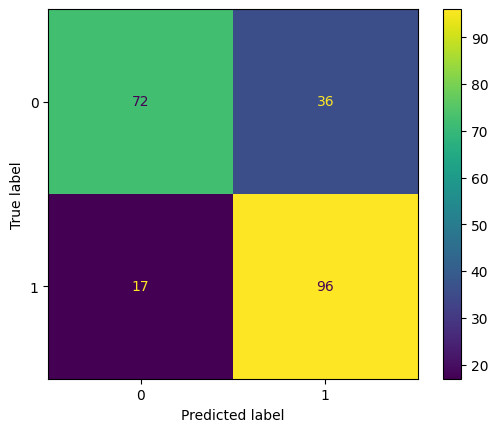

In [ ]:
# PolitiFact K-Neighbors Confusion Matrix
ConfusionMatrixDisplay.from_predictions(test_labels, KNN_pred)
plt.show()

Area under KNN ROC Curve: 0.7581


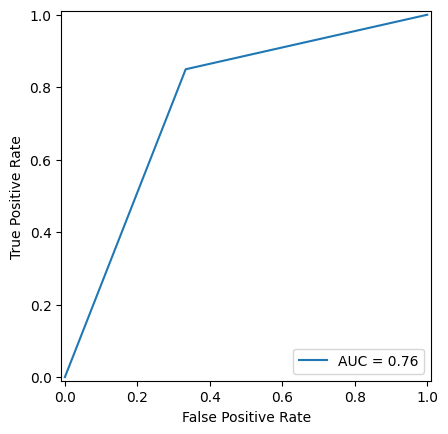

In [ ]:
# PolitiFact K-Neighbors ROC Plot
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions
fpr, tpr, thresholds = roc_curve(test_labels, KNN_pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()
print(f'Area under KNN ROC Curve: {roc_auc_score(test_labels, KNN_pred):.4f}')

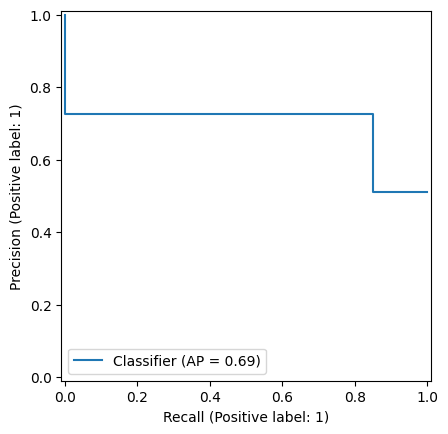

In [ ]:
# PolitiFact K-Neighbors Precision-Recall Plot
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.PrecisionRecallDisplay.html#sklearn.metrics.PrecisionRecallDisplay.from_predictions
PrecisionRecallDisplay.from_predictions(test_labels, KNN_pred)
plt.show()

### [GNN vs K-Means, Use GPU] Politifact Community Detection/Clustering

The NOCD algorithm code below is heavily inspired by the code provided as documentation for the NOCD package: https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb. Additionally, note that the mappings of communities/clusters between time blocks is not consistent.

**Timeblock 1**

In [ ]:
# Consulted: https://pytorch-geometric.readthedocs.io/en/latest/tutorial/create_dataset.html
class CustomDataset(InMemoryDataset):
    def __init__(self, root, transform=None, pre_transform=None, pre_filter=None):
        super().__init__(root, transform, pre_transform, pre_filter)
        self.load(self.processed_paths[0])

    @property
    def raw_file_names(self):
        return ['/content/data/politifact/politifact/raw/new_profile_feature.npz', "/content/data/politifact/politifact/raw/politifact/A.txt", ...]

    @property
    def processed_file_names(self):
        return ['data.pt']

    def process(self):
      # Consulted: https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
      # Consulted: https://pytorch-geometric.readthedocs.io/en/latest/_modules/torch_geometric/datasets/upfd.html#UPFD
        data_list = []
        x = sp.load_npz('/content/data/politifact/politifact/raw/new_profile_feature.npz')
        x = torch.from_numpy(x.todense()).to(torch.float)

        edge_index = read_txt_array("/content/data/politifact/politifact/raw/A.txt", sep=',',dtype=torch.long).t()
        edge_index = coalesce(edge_index, num_nodes=x.size(0))

        data_list.append(pg.data.Data(x=x, edge_index=edge_index, y=[0]))

        if self.pre_filter is not None:
            data_list = [data for data in data_list if self.pre_filter(data)]

        if self.pre_transform is not None:
            data_list = [self.pre_transform(data) for data in data_list]

        self.save(data_list, self.processed_paths[0])

In [ ]:
timeblocks = []
for i in range(len(politifact_windows)):
  split = CustomDataset(root="/content/data/politifact")
  start = politifact_windows[0][0]
  end = politifact_windows[i][1]
  split.transform = pg.transforms.Compose([Add_Timestamps(idx=0, timestamp_vals=politifact_timestamp_vals), TimeMask(start_time=start, end_time=end), pg.transforms.ToUndirected()])
  timeblocks.append(split)

In [ ]:
timeblock1 = timeblocks[0][0]
timeblock2 = timeblocks[1][0]
timeblock3 = timeblocks[2][0]

In [ ]:
timeblock = timeblock1
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = False  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[3003, 10], edge_index=[2, 5382], y=[1], t=[3003])
Epoch    0, loss.full = 2.4342
Epoch   25, loss.full = 1.5783
Epoch   50, loss.full = 1.0507
Epoch   75, loss.full = 0.7753
Epoch  100, loss.full = 0.6367
Epoch  125, loss.full = 0.5474
Epoch  150, loss.full = 0.5360
Epoch  175, loss.full = 0.5458
Epoch  200, loss.full = 0.4701
Epoch  225, loss.full = 0.4829
Epoch  250, loss.full = 0.5096
Epoch  275, loss.full = 0.5160
Epoch  300, loss.full = 0.6051
Epoch  325, loss.full = 0.5831
Epoch  350, loss.full = 0.5859
Epoch  375, loss.full = 0.5545
Epoch  400, loss.full = 0.5378
Epoch  425, loss.full = 0.5457
Epoch  450, loss.full = 0.5746
Epoch  475, loss.full = 0.5631
Breaking due to early stopping at epoch 475


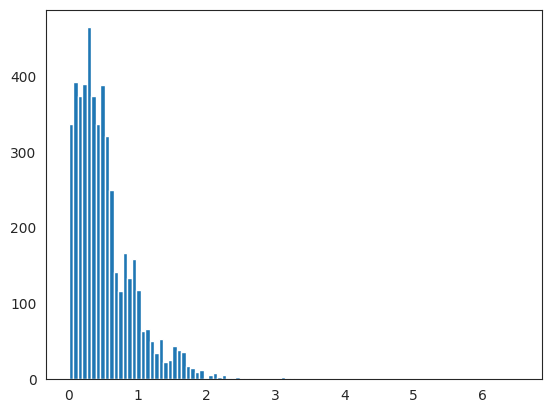

In [ ]:
# "Elbow method" for determining threshold cutoff
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

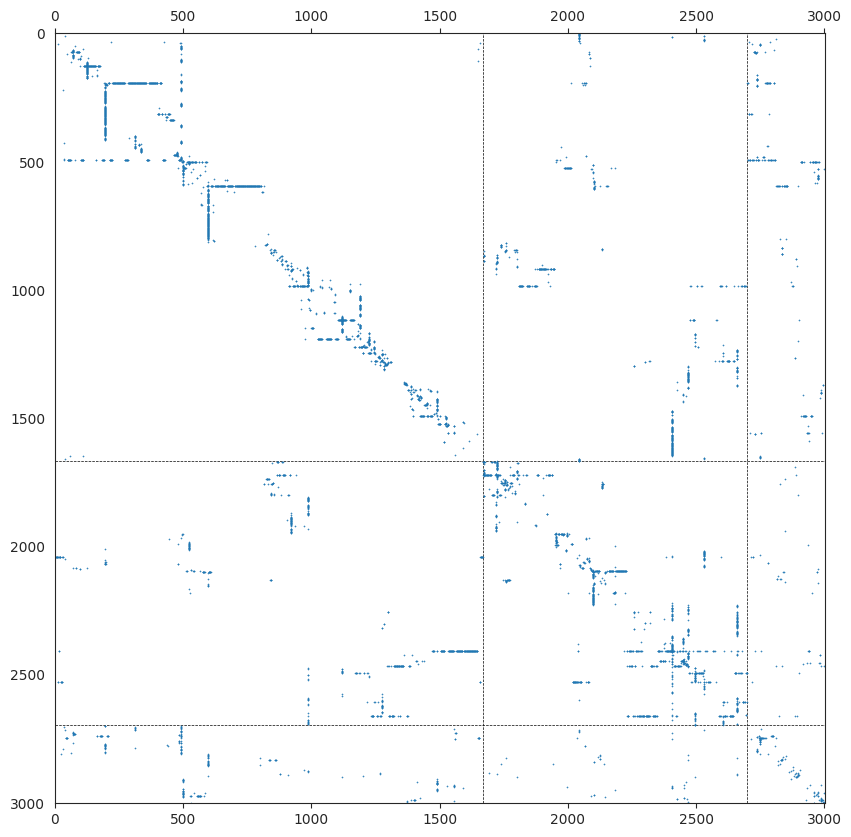

In [ ]:
# Sparse Adjacency Matrix for PolitiFact Timeblock 1 using the code of https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
plt.figure(figsize=[10, 10])
thresh = 0.5

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Community summary statistics calculated using the code of https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# These metrics may be used to inform the number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [ 539 1091  447]

Background (over the entire graph):
 - density    = 5.970e-04
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.5314
 - conductance = 0.4933
 - density     = 1.967e-03
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids for PolitiFact (Timeblock 1)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [0.2244898  0.63265306 0.00581643 0.00627935 0.00797523 0.00908989
 0.01102292 0.23291446 0.15530178 0.47054788]

Verified?: 0.224
Enable geo-spatial positioning: 0.633
Followers count: 0.006
Friends count: 0.006
Status count: 0.008
Favorite count: 0.009
Number of lists: 0.011
Created time: 0.233
Number of words in desc: 0.155
Number of words in name: 0.471

Mean Vector for Community 1: [0.0000000e+00 0.0000000e+00 1.5243181e-04 4.0947823e-03 1.0291098e-02
 3.1883621e-03 1.0896515e-03 2.5783923e-01 1.5153083e-01 3.0807519e-01]

Verified?: 0.000
Enable geo-spatial positioning: 0.000
Followers count: 0.000
Friends count: 0.004
Status count: 0.010
Favorite count: 0.003
Number of lists: 0.001
Created time: 0.258
Number of words in desc: 0.152
Number of words in name: 0.308

Mean Vector for Community 2: [0.07158837 0.74049217 0.0015964  0.00610512 0.00904657 0.01087668
 0.00371086 0.25979546 0.17292278 0.29424807]

Verified?: 0.072
Enable geo-spatial positioning

In [ ]:
# Example of a particular user affiliation
Z_pred[0]

array([False,  True, False])

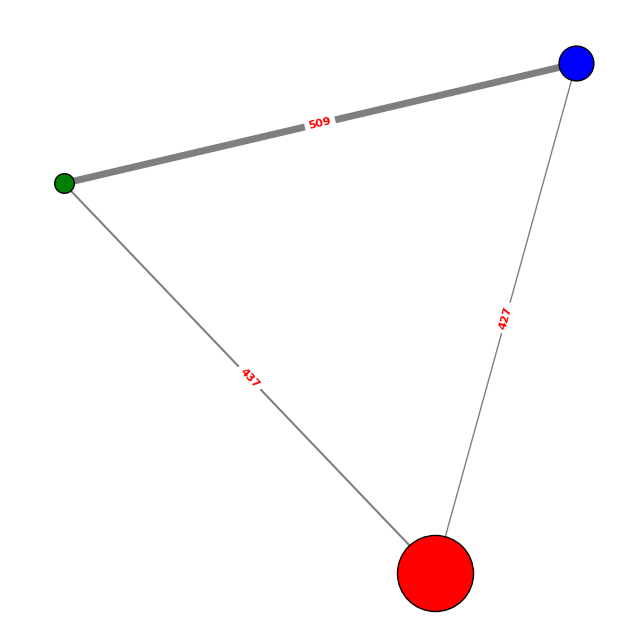

In [ ]:
# Overlapping Community Network of PolitiFact (Timeblock 1)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

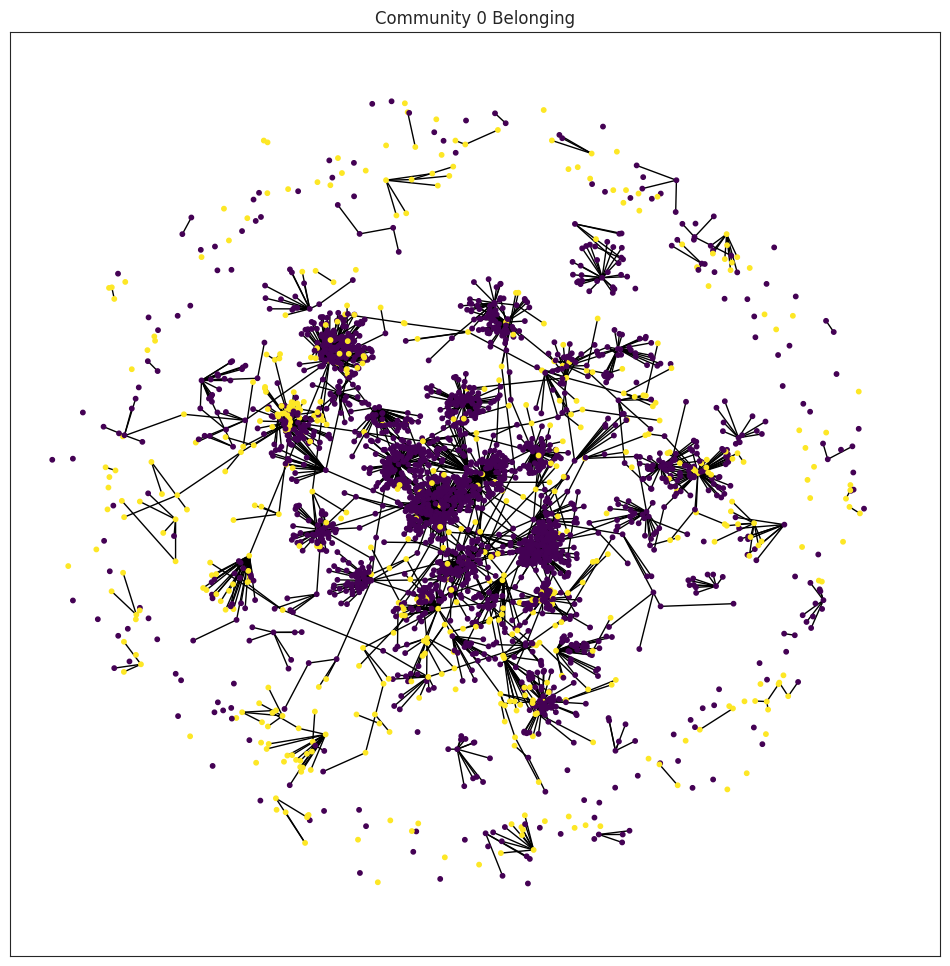

In [ ]:
# Visualization of a particular community in PolitiFact
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 0 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 0], with_labels=False, node_size=10)
plt.show()

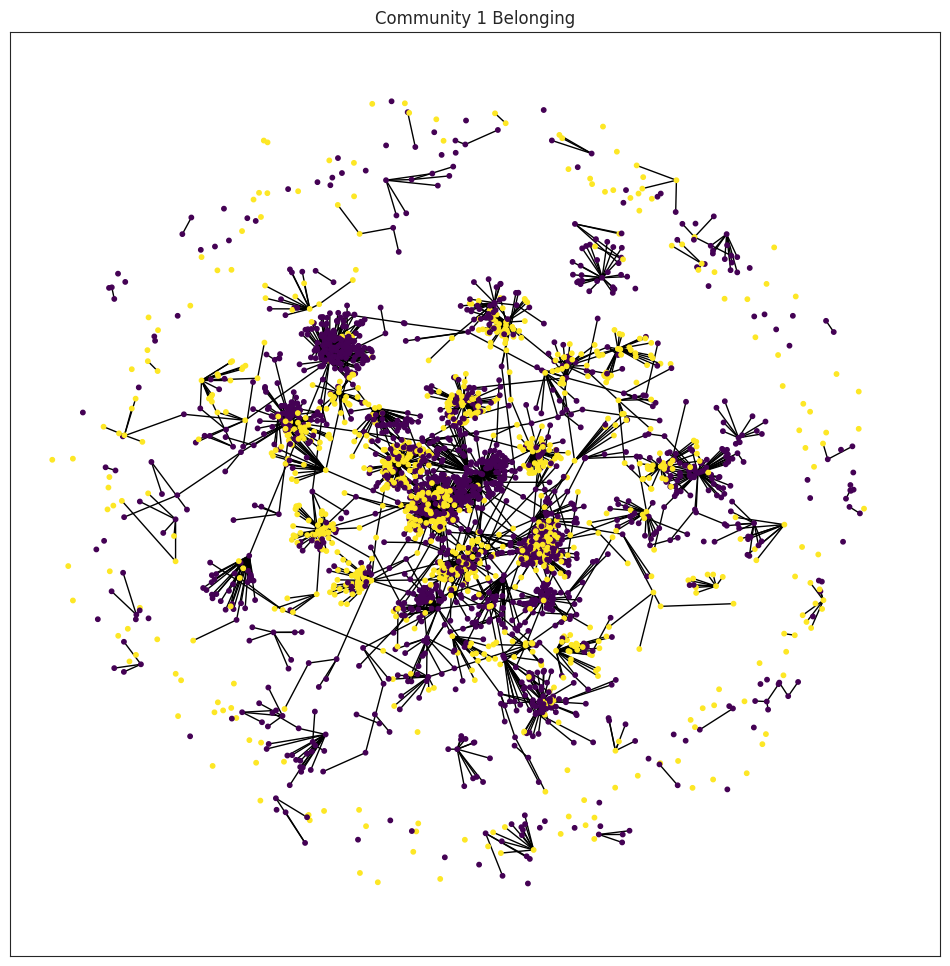

In [ ]:
# Visualization of a particular community in PolitiFact
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 1 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 1], with_labels=False, node_size=10)
plt.show()

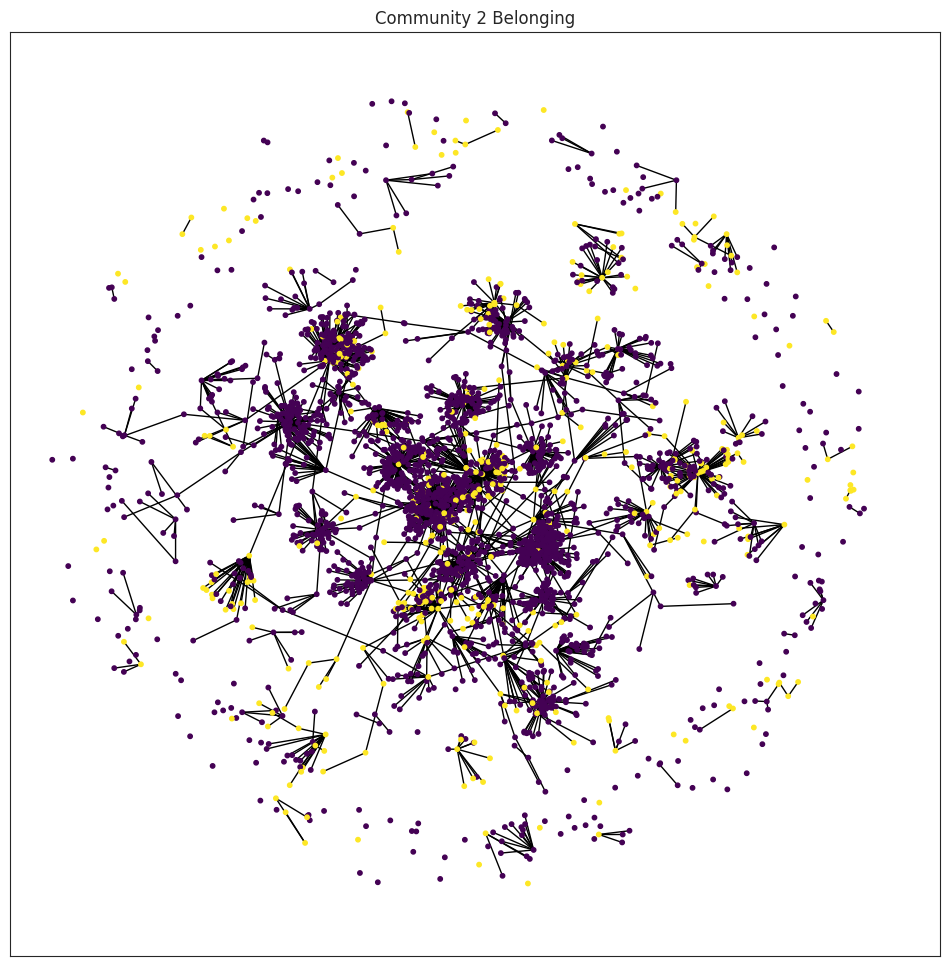

In [ ]:
# Visualization of a particular community in PolitiFact
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 2 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 2], with_labels=False, node_size=10)
plt.show()

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

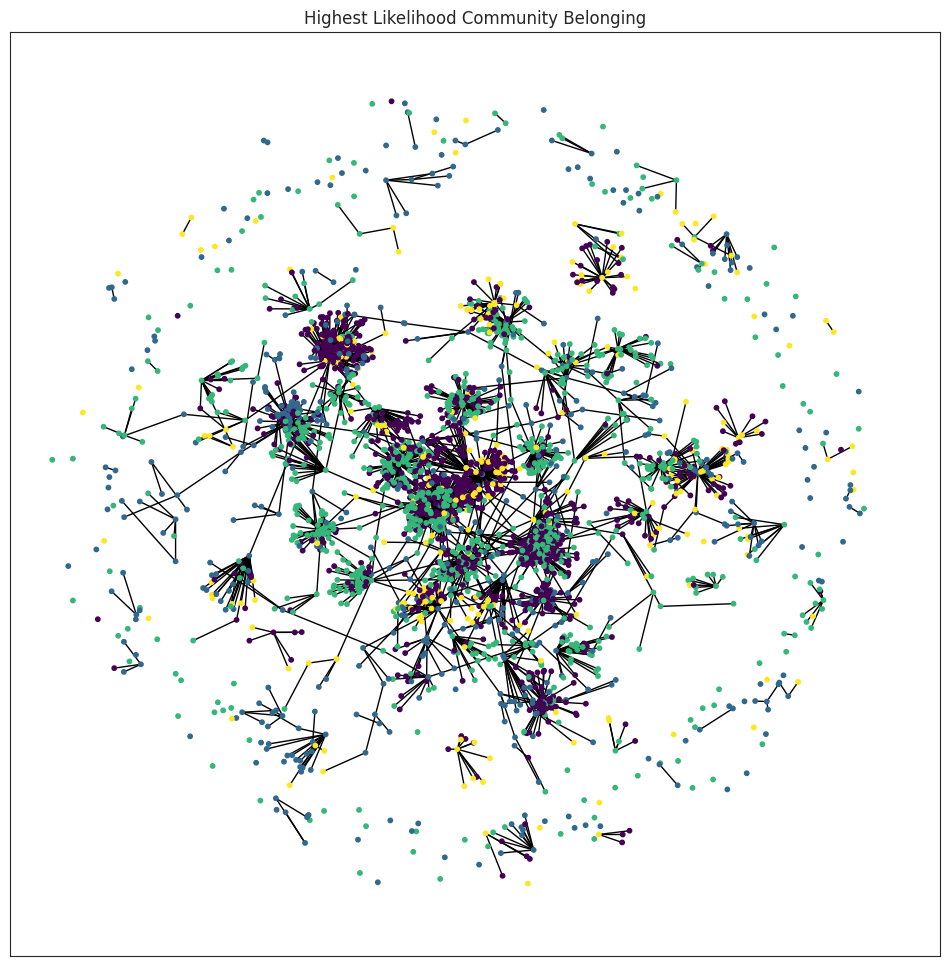

In [ ]:
# Visualization of all communities in PolitiFact
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Highest Likelihood Community Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=min(colors), vmax=max(colors), cmap=CMAP, node_color=colors, with_labels=False, node_size=10)
plt.show()

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes))

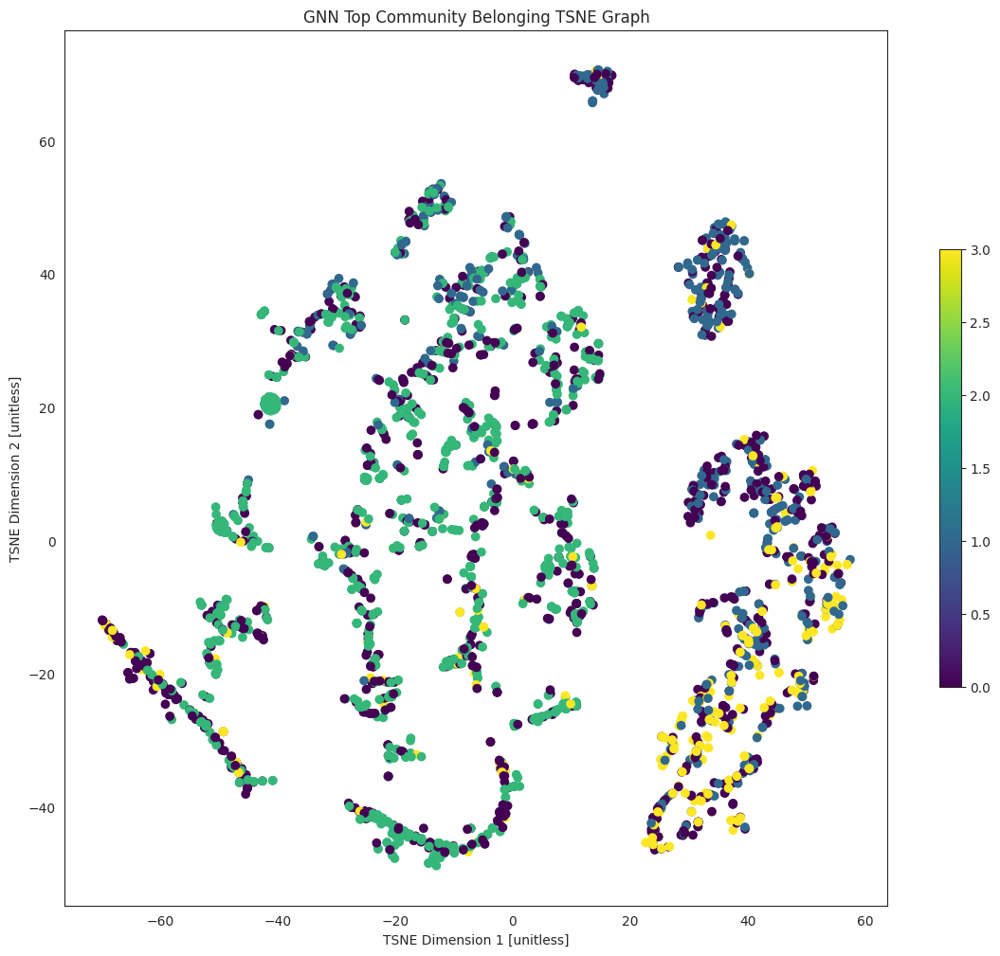

In [ ]:
# t-SNE plot of communities in PolitiFact (Timeblock 1)
plt.figure(figsize=(14, 12))
plt.title("GNN Top Community Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means PolitiFact (Timeblock 1)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Cluster {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Cluster 0: [1.0000017  0.75000054 0.01655955 0.00762196 0.00965759 0.00605847
 0.0329461  0.2032125  0.17272726 0.44660932]

Verified?: 1.000
Enable geo-spatial positioning: 0.750
Followers count: 0.017
Friends count: 0.008
Status count: 0.010
Favorite count: 0.006
Number of lists: 0.033
Created time: 0.203
Number of words in desc: 0.173
Number of words in name: 0.447

Mean Vector for Cluster 1: [1.2964010e-06 3.9339066e-06 1.7264753e-04 3.7750748e-03 9.7129755e-03
 4.5994422e-03 1.0261755e-03 2.6235726e-01 1.4875795e-01 2.8965506e-01]

Verified?: 0.000
Enable geo-spatial positioning: 0.000
Followers count: 0.000
Friends count: 0.004
Status count: 0.010
Favorite count: 0.005
Number of lists: 0.001
Created time: 0.262
Number of words in desc: 0.149
Number of words in name: 0.290

Mean Vector for Cluster 2: [-3.4272671e-07  1.0000030e+00  1.0043068e-04  5.3712879e-03
  7.8237243e-03  9.0536634e-03  1.0035201e-03  2.3397039e-01
  1.6161688e-01  3.8184395e-01]

Verified?: -

In [ ]:
# Feature Importance in K-Means PolitiFact (Timeblock 1)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Enable geo-spatial positioning: 58.91
Verified?: 53.87
Number of words in name: 16.37
Created time: 1.98
Number of lists: 0.43
Number of words in desc: 0.37
Followers count: 0.12
Favorite count: 0.02
Friends count: 0.01
Status count: 0.0


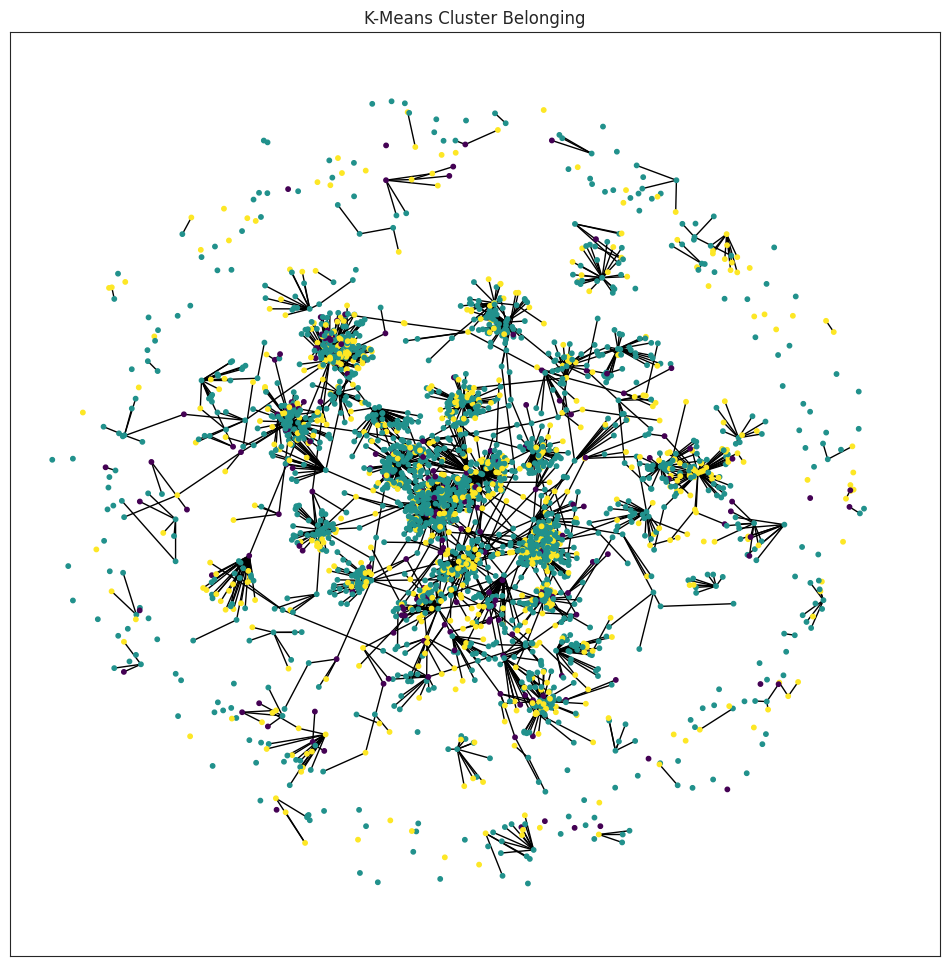

In [ ]:
# Visualization of clusters in PolitiFact (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=kmeans.labels_)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("K-Means Cluster Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=min(kmeans.labels_), vmax=max(kmeans.labels_), cmap=CMAP, node_color=kmeans.labels_, with_labels=False, node_size=10)
plt.show()

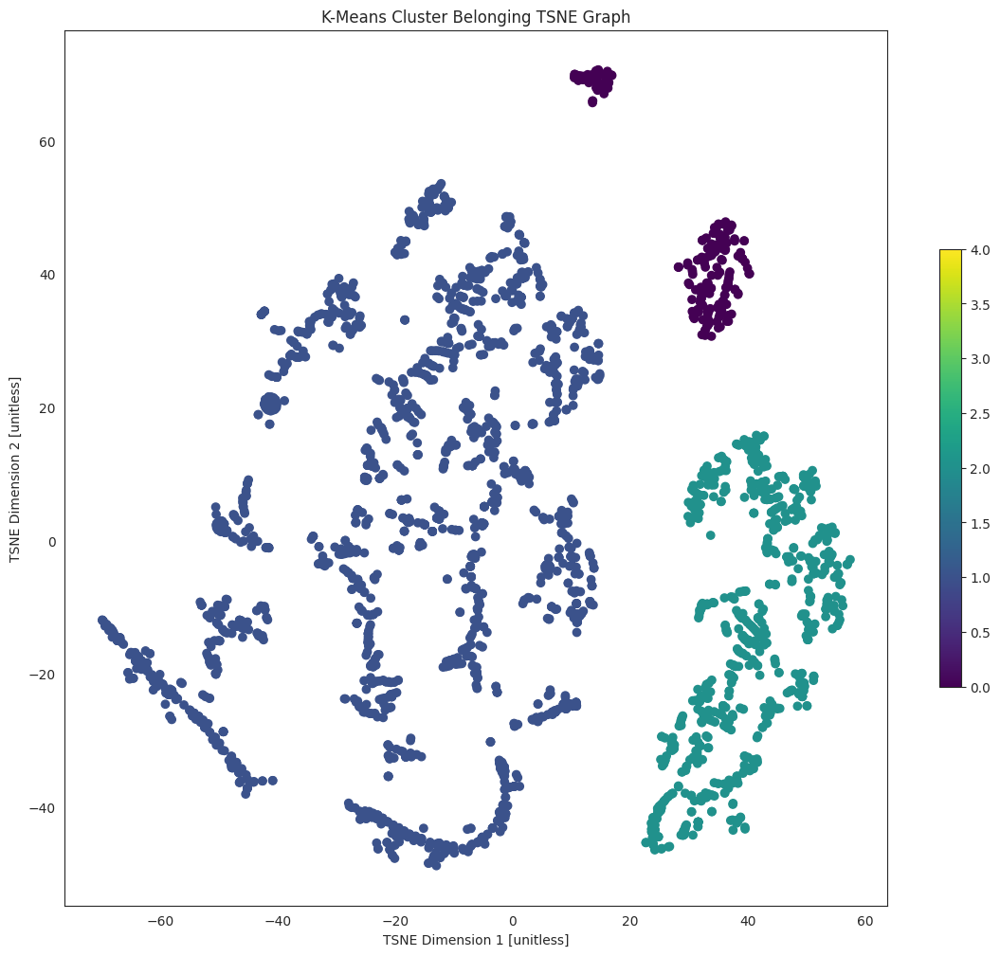

In [ ]:
# t-SNE plot of clusters in PolitiFact (Timeblock 1)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(14, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**Timeblock 2**

In [ ]:
timeblock = timeblock2
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = True  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[10806, 10], edge_index=[2, 20664], y=[1], t=[10806])
Epoch    0, loss.full = 2.4919
Epoch   25, loss.full = 1.0415
Epoch   50, loss.full = 0.8016
Epoch   75, loss.full = 0.7220
Epoch  100, loss.full = 0.6981
Epoch  125, loss.full = 0.6755
Epoch  150, loss.full = 0.6732
Epoch  175, loss.full = 0.7039
Epoch  200, loss.full = 0.5926
Epoch  225, loss.full = 0.5655
Epoch  250, loss.full = 0.5313
Epoch  275, loss.full = 0.5357
Epoch  300, loss.full = 0.4815
Epoch  325, loss.full = 0.4744
Epoch  350, loss.full = 0.4562
Epoch  375, loss.full = 0.4552
Epoch  400, loss.full = 0.4426
Epoch  425, loss.full = 0.4300
Epoch  450, loss.full = 0.4187
Epoch  475, loss.full = 0.3835
Epoch  500, loss.full = 0.3851


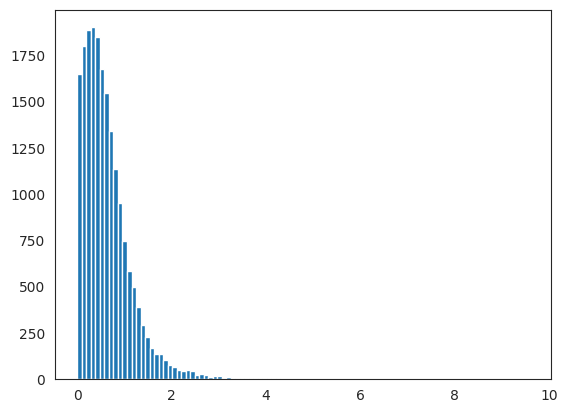

In [ ]:
# "Elbow method" for determining threshold cutoff
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

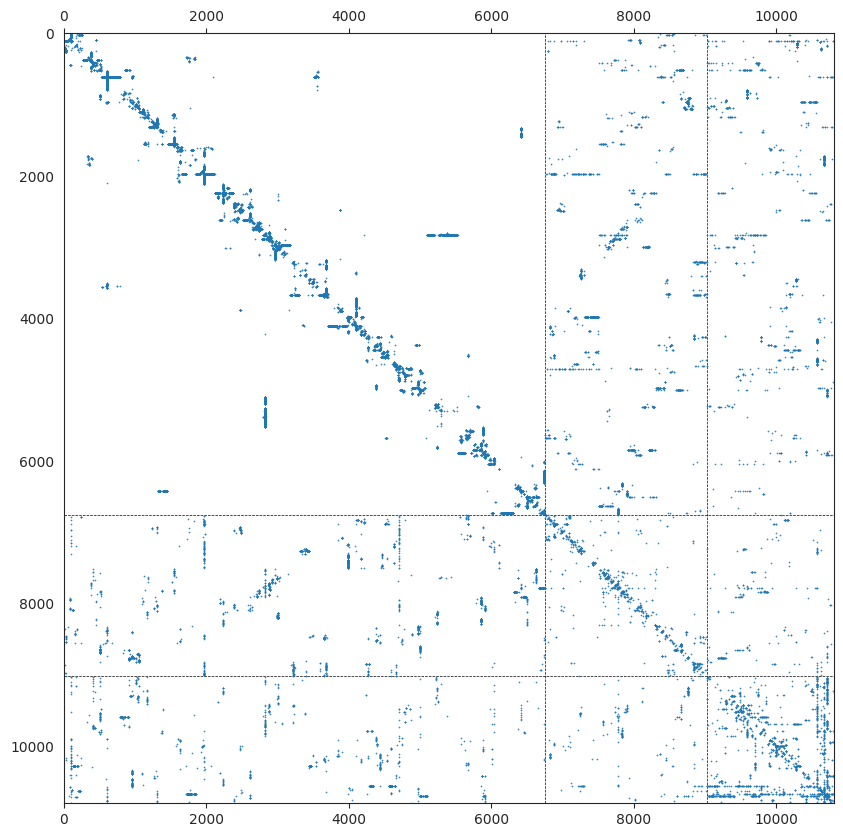

In [ ]:
# Sparse Adjacency Matrix for PolitiFact Timeblock 2 using https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
plt.figure(figsize=[10, 10])
thresh = 0.5

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Community statistics calculated using https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# These metrics may be used to inform the number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [4241 2910 2969]

Background (over the entire graph):
 - density    = 1.770e-04
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.6924
 - conductance = 0.4600
 - density     = 4.729e-04
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids for PolitiFact (Timeblock 2)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [0.03018156 0.44069794 0.00090729 0.00524366 0.01143394 0.01257848
 0.00209566 0.3737568  0.15322937 0.31004453]

Verified?: 0.030
Enable geo-spatial positioning: 0.441
Followers count: 0.001
Friends count: 0.005
Status count: 0.011
Favorite count: 0.013
Number of lists: 0.002
Created time: 0.374
Number of words in desc: 0.153
Number of words in name: 0.310

Mean Vector for Community 1: [0.01890034 0.19656357 0.00062339 0.00637131 0.01288961 0.01325455
 0.00171246 0.35317013 0.15876344 0.37938303]

Verified?: 0.019
Enable geo-spatial positioning: 0.197
Followers count: 0.001
Friends count: 0.006
Status count: 0.013
Favorite count: 0.013
Number of lists: 0.002
Created time: 0.353
Number of words in desc: 0.159
Number of words in name: 0.379

Mean Vector for Community 2: [0.12293702 0.4166386  0.00165123 0.00524129 0.00995899 0.01096723
 0.00484573 0.3040508  0.16310212 0.3705631 ]

Verified?: 0.123
Enable geo-spatial positioning: 0.417
Followers count: 0.002

In [ ]:
# Example of a particular user affiliation
Z_pred[0]

array([ True,  True,  True])

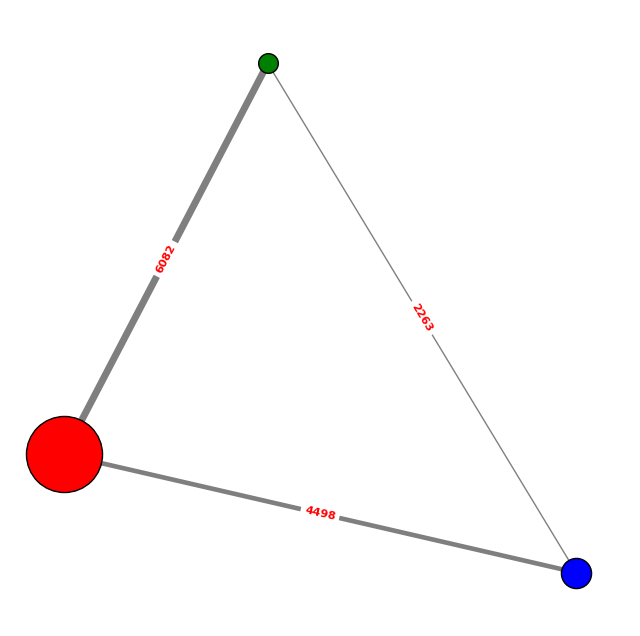

In [ ]:
# Overlapping Community Network of PolitiFact (Timeblock 2)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes))

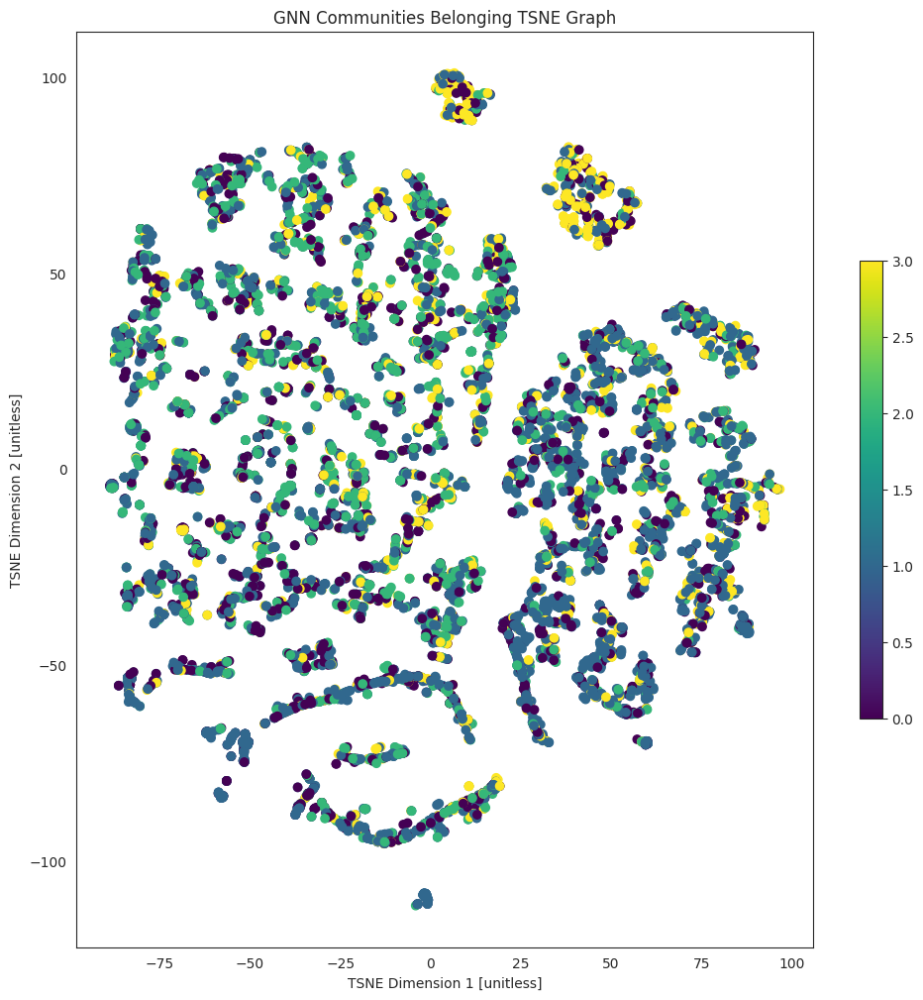

In [ ]:
# t-SNE plot of communities in PolitiFact (Timeblock 2)
plt.figure(figsize=(12, 12))
plt.title("GNN Communities Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means PolitiFact (Timeblock 2)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Cluster {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Cluster 0: [1.0989606e-06 1.0000198e+00 1.1381542e-04 5.9882570e-03 1.1419231e-02
 1.5966572e-02 8.9852989e-04 3.2331884e-01 1.6445734e-01 3.6982569e-01]

Verified?: 0.000
Enable geo-spatial positioning: 1.000
Followers count: 0.000
Friends count: 0.006
Status count: 0.011
Favorite count: 0.016
Number of lists: 0.001
Created time: 0.323
Number of words in desc: 0.164
Number of words in name: 0.370

Mean Vector for Cluster 1: [1.2405217e-06 2.1934509e-05 1.6849639e-04 4.5832172e-03 1.2135701e-02
 9.2488118e-03 8.6697016e-04 3.7373346e-01 1.5297407e-01 3.1702650e-01]

Verified?: 0.000
Enable geo-spatial positioning: 0.000
Followers count: 0.000
Friends count: 0.005
Status count: 0.012
Favorite count: 0.009
Number of lists: 0.001
Created time: 0.374
Number of words in desc: 0.153
Number of words in name: 0.317

Mean Vector for Cluster 2: [0.99999887 0.6717694  0.01407052 0.00773979 0.00949984 0.00742883
 0.03049038 0.23844694 0.1688907  0.4436665 ]

Verified?: 1.000
Enable

In [ ]:
# Feature Importance in K-Means PolitiFact (Timeblock 2)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Verified?: 93.04
Enable geo-spatial positioning: 88.97
Created time: 26.5
Number of words in name: 25.58
Number of lists: 1.0
Number of words in desc: 0.72
Favorite count: 0.23
Followers count: 0.22
Friends count: 0.02
Status count: 0.01


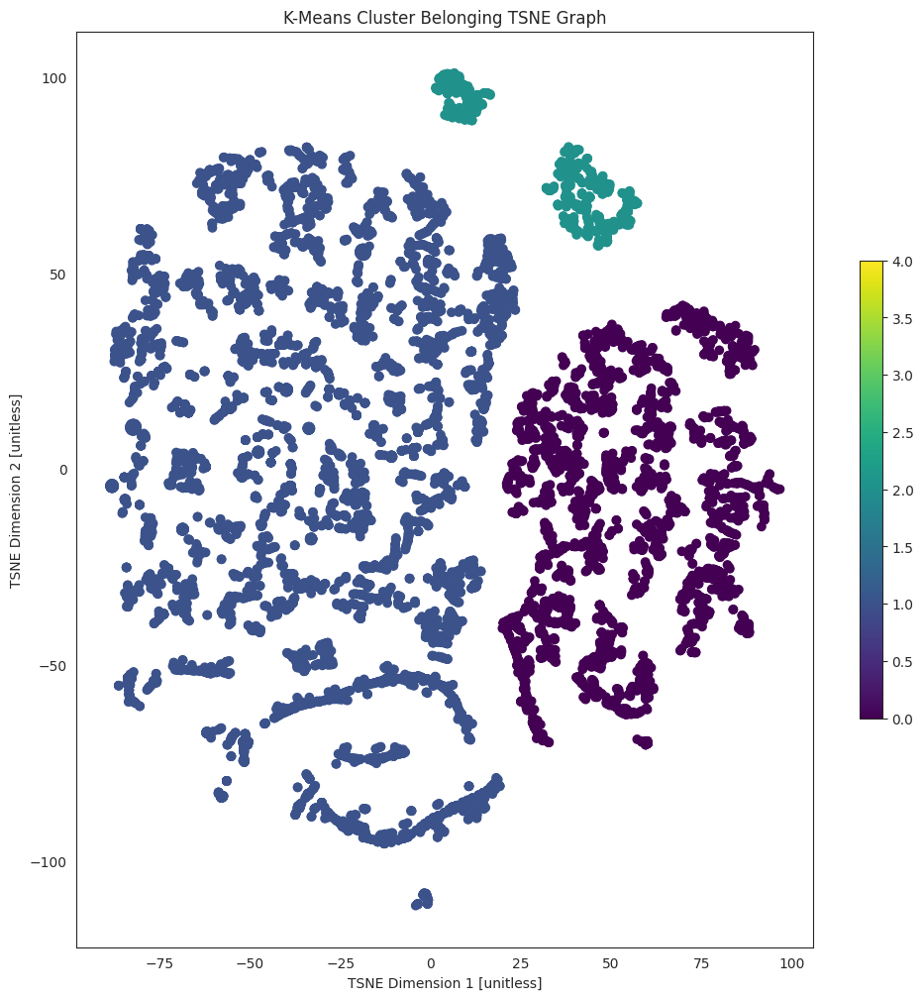

In [ ]:
# t-SNE plot of clusters in PolitiFact (Timeblock 2)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(12, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**Timeblock 3**

In [ ]:
timeblock = timeblock3
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = True  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[41035, 10], edge_index=[2, 80540], y=[1], t=[41035])
Epoch    0, loss.full = 2.7842
Epoch   25, loss.full = 1.4684
Epoch   50, loss.full = 0.9929
Epoch   75, loss.full = 0.7821
Epoch  100, loss.full = 0.6522
Epoch  125, loss.full = 0.7011
Epoch  150, loss.full = 0.6349
Epoch  175, loss.full = 0.6071
Epoch  200, loss.full = 0.5564
Epoch  225, loss.full = 0.4768
Epoch  250, loss.full = 0.4140
Epoch  275, loss.full = 0.4095
Epoch  300, loss.full = 0.4489
Epoch  325, loss.full = 0.4174
Epoch  350, loss.full = 0.4075
Epoch  375, loss.full = 0.3997
Epoch  400, loss.full = 0.3876
Epoch  425, loss.full = 0.4018
Epoch  450, loss.full = 0.4355
Epoch  475, loss.full = 0.4087
Epoch  500, loss.full = 0.4062


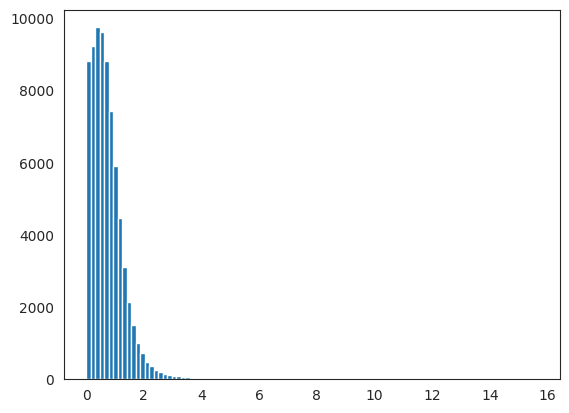

In [ ]:
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

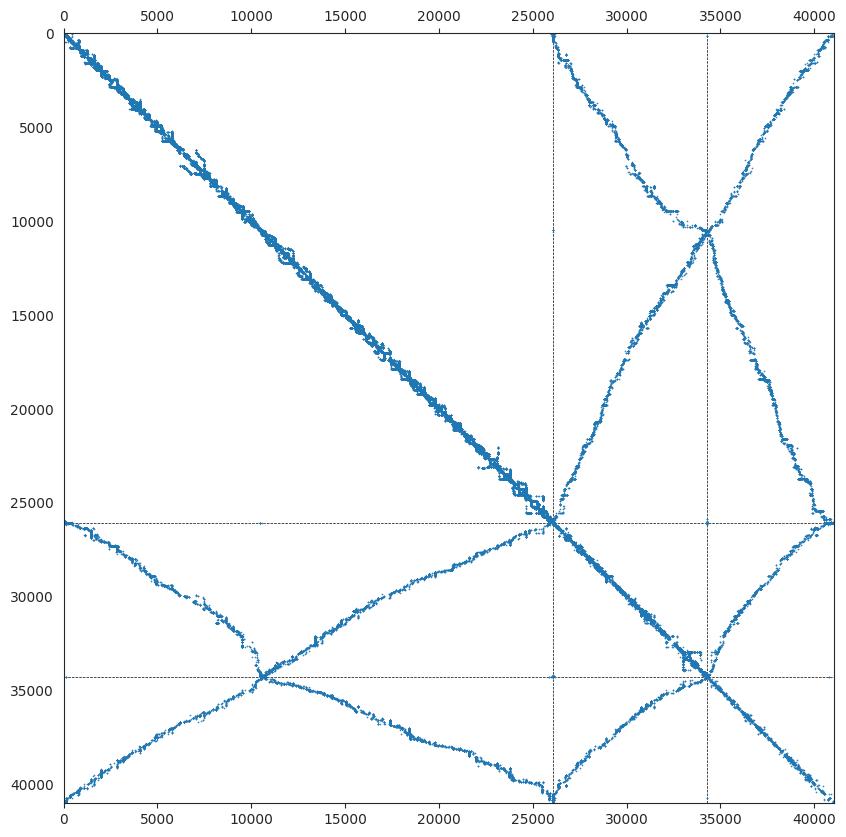

In [ ]:
# Sparse Adjacency Matrix for PolitiFact Timeblock 3 using https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
plt.figure(figsize=[10, 10])
thresh = 0.5

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Community summary statistics calculated using https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# These metrics may be used to inform the number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [20652 11727 12613]

Background (over the entire graph):
 - density    = 4.783e-05
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.7950
 - conductance = 0.3700
 - density     = 1.071e-04
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids for PolitiFact (Timeblock 3)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [8.4253345e-03 2.8002131e-01 2.4679783e-04 9.2530856e-03 1.4084583e-02
 3.6084585e-02 8.8603399e-04 5.1591700e-01 1.6416669e-01 3.4082675e-01]

Verified?: 0.008
Enable geo-spatial positioning: 0.280
Followers count: 0.000
Friends count: 0.009
Status count: 0.014
Favorite count: 0.036
Number of lists: 0.001
Created time: 0.516
Number of words in desc: 0.164
Number of words in name: 0.341

Mean Vector for Community 1: [0.06438134 0.36113244 0.00097497 0.00663766 0.01198326 0.02621183
 0.0026407  0.4006808  0.1709141  0.38075924]

Verified?: 0.064
Enable geo-spatial positioning: 0.361
Followers count: 0.001
Friends count: 0.007
Status count: 0.012
Favorite count: 0.026
Number of lists: 0.003
Created time: 0.401
Number of words in desc: 0.171
Number of words in name: 0.381

Mean Vector for Community 2: [0.0478871  0.51193213 0.00082257 0.00637507 0.01068853 0.02553391
 0.00212125 0.47711426 0.15463287 0.32753283]

Verified?: 0.048
Enable geo-spatial positioning

In [ ]:
# Example of a particular user affiliation
Z_pred[0]

array([ True,  True,  True])

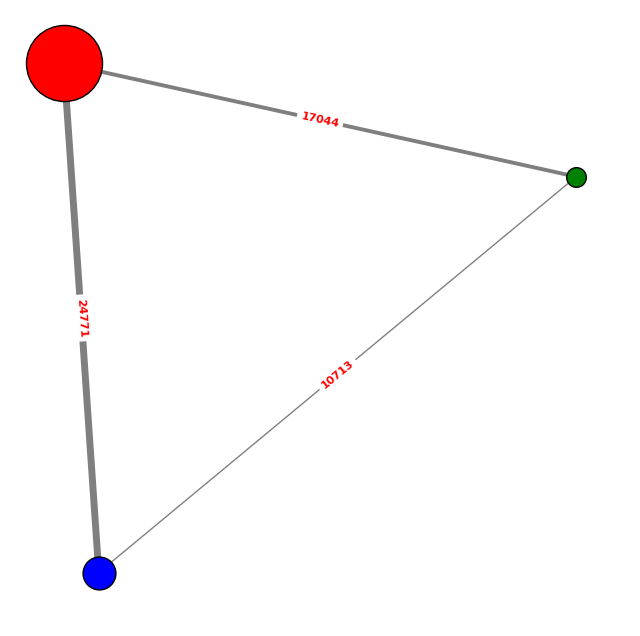

In [ ]:
## Overlapping Community Network of PolitiFact (Timeblock 3)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes))

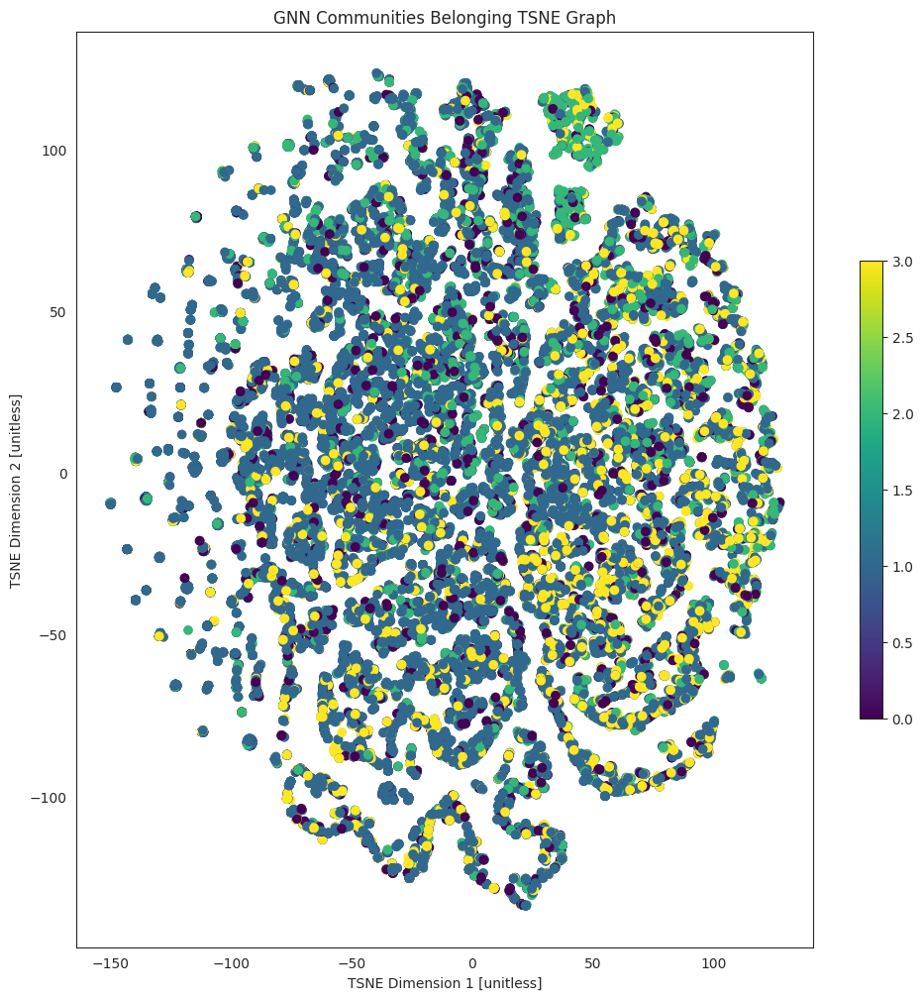

In [ ]:
# t-SNE plot of communities in PolitiFact (Timeblock 3)
plt.figure(figsize=(12, 12))
plt.title("GNN Communities Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means PolitiFact (Timeblock 3)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Cluster {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Cluster 0: [1.9814281e-02 5.3972006e-05 4.5774819e-04 9.4497614e-03 1.4030153e-02
 3.4205932e-02 1.3391859e-03 4.7910756e-01 1.7094685e-01 4.7596008e-01]

Verified?: 0.020
Enable geo-spatial positioning: 0.000
Followers count: 0.000
Friends count: 0.009
Status count: 0.014
Favorite count: 0.034
Number of lists: 0.001
Created time: 0.479
Number of words in desc: 0.171
Number of words in name: 0.476

Mean Vector for Cluster 1: [5.21854237e-02 1.00000715e+00 6.90639659e-04 7.98451528e-03
 1.31288525e-02 3.27158831e-02 2.09323363e-03 4.21788812e-01
 1.66502982e-01 3.74762118e-01]

Verified?: 0.052
Enable geo-spatial positioning: 1.000
Followers count: 0.001
Friends count: 0.008
Status count: 0.013
Favorite count: 0.033
Number of lists: 0.002
Created time: 0.422
Number of words in desc: 0.167
Number of words in name: 0.375

Mean Vector for Cluster 2: [3.0990671e-03 3.3468008e-05 7.0880458e-05 3.1895707e-03 9.5834471e-03
 1.7653584e-02 3.8406160e-04 5.4769075e-01 1.4392945e-0

In [ ]:
# Feature Importance in K-Means PolitiFact (Timeblock 3)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Enable geo-spatial positioning: 164.87
Created time: 155.63
Number of words in name: 53.81
Verified?: 31.07
Number of words in desc: 9.14
Favorite count: 3.79
Friends count: 0.54
Status count: 0.32
Number of lists: 0.04
Followers count: 0.01


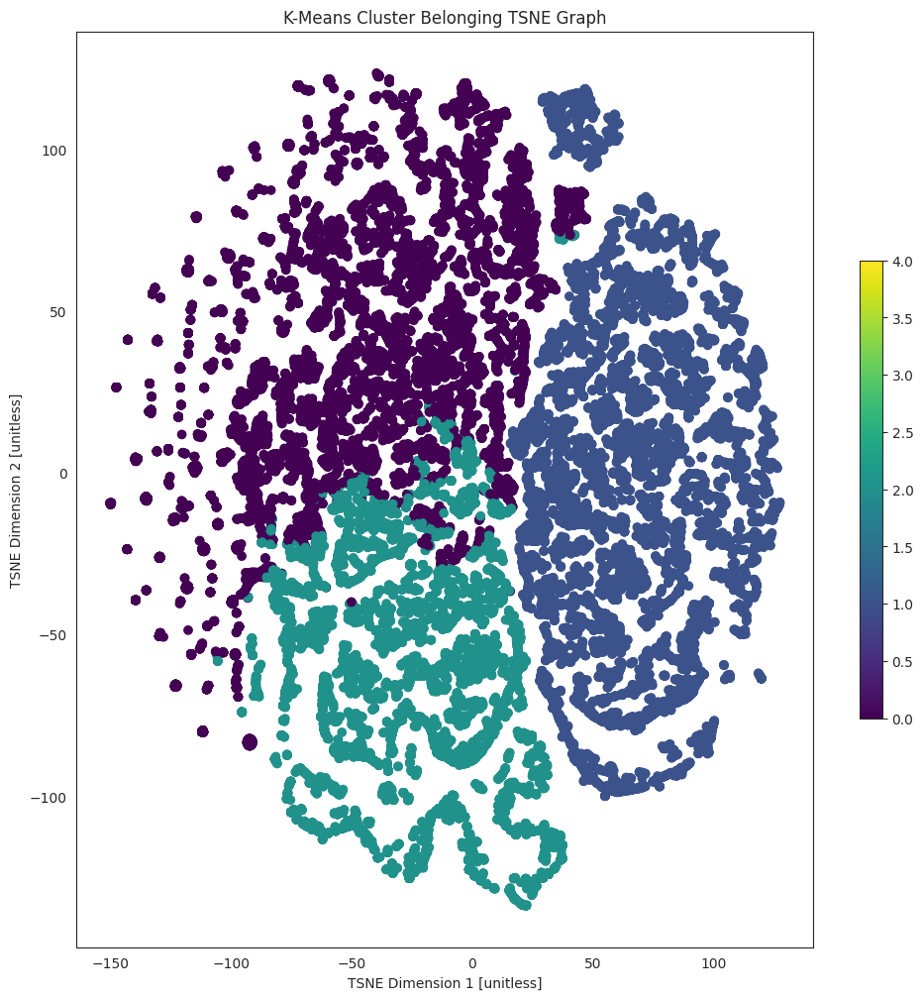

In [ ]:
# t-SNE plot of clusters in PolitiFact (Timeblock 3)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(12, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

## GossipCop

### [GNN, Use CPU] Graph Classification using Native Dataset (Not-Temporal)

In [ ]:
# Using optimal hyperparameters from https://github.com/safe-graph/GNN-FakeNews/blob/main/hyper_parameters.md

train_loader = pg.loader.DataLoader(gossipcop_train, batch_size=128, shuffle=True)
val_loader = pg.loader.DataLoader(gossipcop_val, batch_size=128, shuffle=False)
test_loader = pg.loader.DataLoader(gossipcop_test, batch_size=128, shuffle=False)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = nocd.nn.GCN(gossipcop_train[0].x.shape[1], [128], 2).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = torch.nn.CrossEntropyLoss()
NUM_EPOCHS = 40
NUM_FEATURES = 10
NUM_CLASSES = 2

# Training loop inspired by official PyG Graph Classification GCN and upfd.py from https://github.com/pyg-team/pytorch_geometric/blob/master/examples/upfd.py
def train():
    model.train()

    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()

        # Adjacency computation is repeated because it cannot be stored in memory
        graph = pg.utils.to_networkx(data)
        adj = nx.adjacency_matrix(graph)
        adj = coo_matrix(adj)

        # https://discuss.pytorch.org/t/creating-a-sparse-tensor-from-csr-matrix/13658/4
        values = adj.data
        indices = np.vstack((adj.row, adj.col))
        adj = torch.sparse.FloatTensor(torch.LongTensor(indices), torch.FloatTensor(values), torch.Size(adj.shape)).to_dense()

        # The GCN is made for node classification, so we pool the predictions for each node
        node_outputs = model(data.x, adj)
        output = pg.nn.global_mean_pool(node_outputs, data.batch)
        loss = criterion(output, data.y)

        loss.backward()
        optimizer.step()
        total_loss += float(loss) * data.num_graphs

    return total_loss / len(train_loader.dataset)

# Evaluation loop inspired by official PyG Graph Classification GCN
def test(loader, holdout=False):
    model.eval()
    outputs = []
    ground_truth = []
    total_loss = 0
    with torch.no_grad():
        for data in loader:
            data = data.to(device)

            # Adjacency computation is repeated because it cannot be stored in memory
            graph = pg.utils.to_networkx(data)
            adj = nx.adjacency_matrix(graph)
            adj = coo_matrix(adj)

            # https://discuss.pytorch.org/t/creating-a-sparse-tensor-from-csr-matrix/13658/4
            values = adj.data
            indices = np.vstack((adj.row, adj.col))
            adj = torch.sparse.FloatTensor(torch.LongTensor(indices), torch.FloatTensor(values), torch.Size(adj.shape)).to_dense()

            # The GCN is made for node classification, so we pool the predictions for each node
            node_outputs = model(data.x, adj)
            output = pg.nn.global_mean_pool(node_outputs, data.batch)
            loss = criterion(output, data.y)
            total_loss += float(loss) * data.num_graphs


            prediction = output.argmax(dim=1)

            outputs.append(prediction.cpu())
            ground_truth.append(data.y.cpu())


    outputs = torch.cat(outputs)
    ground_truth = torch.cat(ground_truth)
    avg_loss = total_loss / len(loader.dataset)

    accuracy = accuracy_score(ground_truth.numpy(), outputs.numpy())

    if holdout:
      return accuracy, avg_loss, outputs, ground_truth
    else:
      return accuracy, avg_loss

# Inspired by upfd.py from https://github.com/pyg-team/pytorch_geometric/blob/master/examples/upfd.py
train_loss_list = []
val_loss_list = []
train_acc_per_epoch = []
val_acc_per_epoch = []
for epoch in range(NUM_EPOCHS):
    loss = train()
    train_loss_list.append(loss)

    train_acc, _ = test(train_loader, holdout=False)
    train_acc_per_epoch.append(train_acc)

    val_acc, val_loss = test(val_loader, holdout=False)
    val_loss_list.append(val_loss)
    val_acc_per_epoch.append(val_acc)

    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Train: {train_acc:.4f}, '
          f'Val: {val_acc:.4f}')

test_acc, _, pred, gt = test(test_loader, holdout=True)
test_precision = precision_score(gt, pred)
test_recall = recall_score(gt, pred)
test_f1 = f1_score(gt, pred)
print(f'Test Acc of Final Model: {test_acc:.4f}')
print(f'Test Precision of Final Model: {test_precision:.4f}')
print(f'Test Recall of Final Model: {test_recall:.4f}')
print(f'Test F1 Score of Final Model: {test_f1:.4f}')

Epoch: 00, Loss: 1.4697, Train: 0.5421, Val: 0.5092
Epoch: 01, Loss: 1.1933, Train: 0.6200, Val: 0.6172
Epoch: 02, Loss: 1.0749, Train: 0.7518, Val: 0.7784
Epoch: 03, Loss: 0.9069, Train: 0.7701, Val: 0.7784
Epoch: 04, Loss: 0.8882, Train: 0.8077, Val: 0.8242
Epoch: 05, Loss: 0.7523, Train: 0.8260, Val: 0.8462
Epoch: 06, Loss: 0.7784, Train: 0.8297, Val: 0.8553
Epoch: 07, Loss: 0.6605, Train: 0.8306, Val: 0.8498
Epoch: 08, Loss: 0.6970, Train: 0.8507, Val: 0.8498
Epoch: 09, Loss: 0.5826, Train: 0.8608, Val: 0.8681
Epoch: 10, Loss: 0.5528, Train: 0.8654, Val: 0.8516
Epoch: 11, Loss: 0.5321, Train: 0.8608, Val: 0.8498
Epoch: 12, Loss: 0.5320, Train: 0.8626, Val: 0.8681
Epoch: 13, Loss: 0.5093, Train: 0.8599, Val: 0.8645
Epoch: 14, Loss: 0.4959, Train: 0.8636, Val: 0.8608
Epoch: 15, Loss: 0.4720, Train: 0.8617, Val: 0.8553
Epoch: 16, Loss: 0.4878, Train: 0.8654, Val: 0.8681
Epoch: 17, Loss: 0.4359, Train: 0.8617, Val: 0.8553
Epoch: 18, Loss: 0.4548, Train: 0.8700, Val: 0.8626
Epoch: 19, L

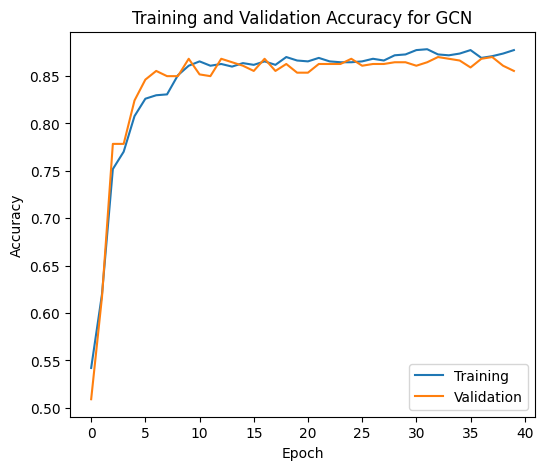

In [ ]:
# GNN Classifier Accuracy Plot for GossipCop
plt.figure(figsize=(6,5))
plt.title("Training and Validation Accuracy for GCN")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.plot(np.arange(len(train_acc_per_epoch)), train_acc_per_epoch, label="Training")
plt.plot(np.arange(len(val_acc_per_epoch)), val_acc_per_epoch, label="Validation")
plt.legend()
plt.show()

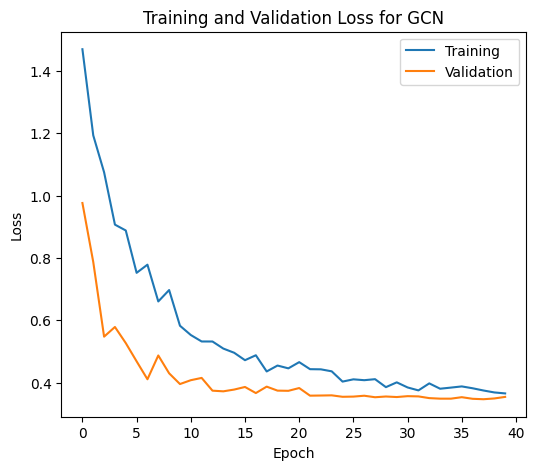

In [ ]:
# GNN Classifier Loss Plot for GossipCop
plt.figure(figsize=(6,5))
plt.title("Training and Validation Loss for GCN")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.plot(np.arange(len(train_loss_list)), train_loss_list, label="Training")
plt.plot(np.arange(len(val_loss_list)), val_loss_list, label="Validation")
plt.legend()
plt.show()

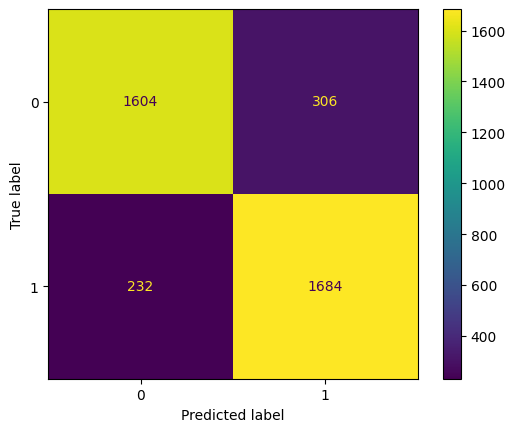

In [ ]:
# GNN Classifier Confusion Matrix for GossipCop
ConfusionMatrixDisplay.from_predictions(torch.cat([truth.view(-1) for truth in gt]).tolist(), torch.cat([output.view(-1) for output in pred]).tolist())
plt.show()

Area under ROC Curve: 0.8594


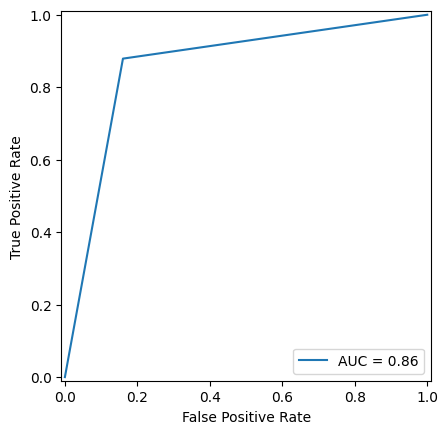

In [ ]:
# GNN Classifier ROC Plot for GossipCop
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions
fpr, tpr, thresholds = roc_curve(gt, pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()
print(f'Area under ROC Curve: {roc_auc_score(gt, pred):.4f}')

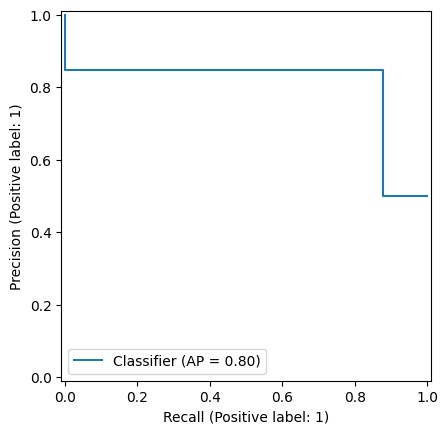

In [ ]:
# # GNN Classifier Precision-Recall Plot for GossipCop
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.PrecisionRecallDisplay.html#sklearn.metrics.PrecisionRecallDisplay.from_predictions
PrecisionRecallDisplay.from_predictions(gt, pred)
plt.show()

### [KNN, Use CPU] Graph Classification using Native Dataset (Non-Temporal)

In [ ]:
# Hyperparameter Tuning via https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html#sklearn.model_selection.GridSearchCV
train_loader = pg.loader.DataLoader(gossipcop_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(gossipcop_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(gossipcop_test, batch_size=1, shuffle=False)

gossipcop_train_vectors = []
train_labels = []
gossipcop_test_vectors = []
test_labels = []

for i in train_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  gossipcop_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

parameters = {
    'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute'),
    'n_neighbors': np.arange(1, 21),
    'p': [1, 2, 3],
    'weights': ('uniform', 'distance')
}

# GridSearchCV does cross-validation for us on the training data so we combine train & val
model = KNeighborsClassifier()
clf = GridSearchCV(estimator=model, cv=10, param_grid=parameters)

clf.fit(gossipcop_train_vectors, train_labels)
clf.best_params_

{'algorithm': 'auto',
 'n_neighbors': np.int64(4),
 'p': 1,
 'weights': 'distance'}

In [ ]:
train_loader = pg.loader.DataLoader(gossipcop_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(gossipcop_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(gossipcop_test, batch_size=1, shuffle=False)

ALGORITHM = clf.best_params_["algorithm"] # "auto"
NUM_NEIGHBORS = clf.best_params_["n_neighbors"] # 4
P = clf.best_params_["p"] # 1
WEIGHTS = clf.best_params_["weights"] # "distance"

gossipcop_train_vectors = []
train_labels = []
gossipcop_test_vectors = []
test_labels = []

for i in train_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  gossipcop_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

neigh = KNeighborsClassifier(algorithm=ALGORITHM, n_neighbors=NUM_NEIGHBORS, p=P, weights=WEIGHTS)
neigh.fit(gossipcop_train_vectors, train_labels)

KNN_train_acc = neigh.score(gossipcop_train_vectors, train_labels)
KNN_test_acc = neigh.score(gossipcop_test_vectors, test_labels)
KNN_pred = neigh.predict(gossipcop_test_vectors)

print(f'Train Acc: {KNN_train_acc:.4f}')
print()
print(f'Test Acc: {KNN_test_acc:.4f}')

KNN_test_precision = precision_score(test_labels, KNN_pred)
KNN_test_recall = recall_score(test_labels, KNN_pred)
KNN_test_f1 = f1_score(test_labels, KNN_pred)
print(f'Test Precision: {KNN_test_precision:.4f}')
print(f'Test Recall: {KNN_test_recall:.4f}')
print(f'Test F1 Score: {KNN_test_f1:.4f}')

Train Acc: 1.0000

Test Acc: 0.8487
Test Precision: 0.9069
Test Recall: 0.7777
Test F1 Score: 0.8373


In [ ]:
train_loader = pg.loader.DataLoader(gossipcop_train, batch_size=1, shuffle=False)
val_loader = pg.loader.DataLoader(gossipcop_val, batch_size=1, shuffle=False)
test_loader = pg.loader.DataLoader(gossipcop_test, batch_size=1, shuffle=False)

ALGORITHM = clf.best_params_["algorithm"] # "auto"
NUM_NEIGHBORS = clf.best_params_["n_neighbors"] # 4
P = clf.best_params_["p"] # 1
WEIGHTS = clf.best_params_["weights"] # "distance"

gossipcop_train_vectors = []
train_labels = []
gossipcop_test_vectors = []
test_labels = []

for i in train_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in val_loader:
  gossipcop_train_vectors.append(torch.mean(i.x, dim=0).tolist())
  train_labels.append(i.y[0].tolist())
for i in test_loader:
  gossipcop_test_vectors.append(torch.mean(i.x, dim=0).tolist())
  test_labels.append(i.y[0].tolist())

neigh = KNeighborsClassifier(algorithm=ALGORITHM, n_neighbors=NUM_NEIGHBORS, p=P, weights=WEIGHTS)
neigh.fit(gossipcop_train_vectors, train_labels)

# Feature Importance for K-Neighbors in GossipCop
results = permutation_importance(neigh, gossipcop_train_vectors, train_labels, scoring="accuracy")
importance = np.round(results.importances_mean, 3)
print(importance)

# 1) Verified?
# 2) Enable geo-spatial positioning
# 3) Followers count
# 4) Friends count
# 5) Status count
# 6) Favorite count
# 7) Number of lists
# 8) Created time (No. of months since Twitter established)
# 9) Number of words in the description
# 10) Number of words in the screen name

[0.187 0.171 0.    0.    0.025 0.006 0.    0.205 0.009 0.046]


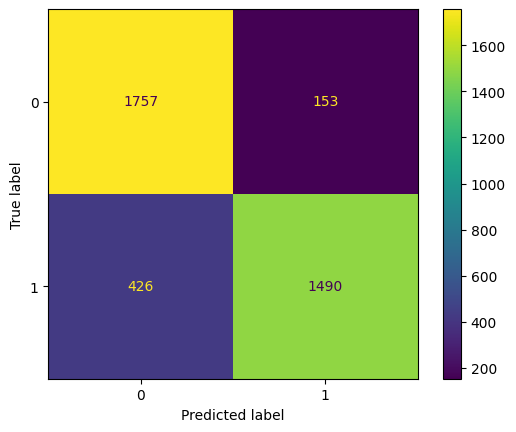

In [ ]:
# K-Neighbors Classifier Confusion Matrix for GossipCop
ConfusionMatrixDisplay.from_predictions(test_labels, KNN_pred)
plt.show()

Area under KNN ROC Curve: 0.8488


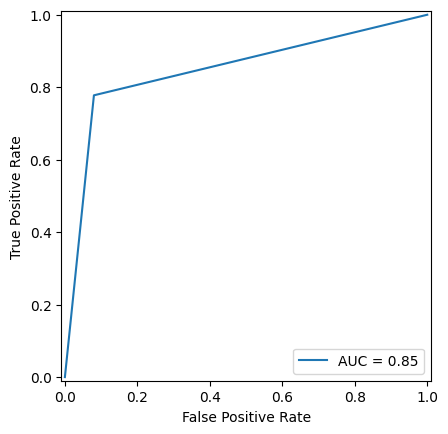

In [ ]:
# K-Neighbors Classifier ROC Plot for GossipCop
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions
fpr, tpr, thresholds = roc_curve(test_labels, KNN_pred)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
display.plot()
print(f'Area under KNN ROC Curve: {roc_auc_score(test_labels, KNN_pred):.4f}')

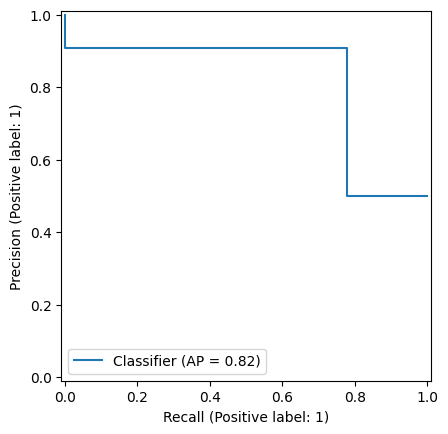

In [ ]:
# K-Neighbors Classifier Precision-Recall Plot for GossipCop
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.PrecisionRecallDisplay.html#sklearn.metrics.PrecisionRecallDisplay.from_predictions
PrecisionRecallDisplay.from_predictions(test_labels, KNN_pred)
plt.show()

### [GNN vs K-Means, Use GPU] GossipCop Community/Clustering
The NOCD algorithm code below is heavily inspired by the code provided as documentation for the NOCD package: https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb. Additionally, note that the mappings of communities/clusters between time blocks is not consistent.

In [ ]:
# Consulted: https://pytorch-geometric.readthedocs.io/en/latest/tutorial/create_dataset.html
class CustomDataset2(InMemoryDataset):
    def __init__(self, root, transform=None, pre_transform=None, pre_filter=None):
        super().__init__(root, transform, pre_transform, pre_filter)
        self.load(self.processed_paths[0])

    @property
    def raw_file_names(self):
        return ['/content/data/gossipcop/gossipcop/raw/new_profile_feature.npz', "/content/data/gossipcop/gossipcop/raw/A.txt", ...]

    @property
    def processed_file_names(self):
        return ['data.pt']

    def process(self):
      # Consulted: https://github.com/shchur/overlapping-community-detection/blob/master/interactive.ipynb
      # Consulted: https://pytorch-geometric.readthedocs.io/en/latest/_modules/torch_geometric/datasets/upfd.html#UPFD
        data_list = []
        x = sp.load_npz('/content/data/gossipcop/gossipcop/raw/new_profile_feature.npz')
        x = torch.from_numpy(x.todense()).to(torch.float)

        edge_index = read_txt_array("/content/data/gossipcop/gossipcop/raw/A.txt", sep=',',dtype=torch.long).t()
        edge_index = coalesce(edge_index, num_nodes=x.size(0))

        data_list.append(pg.data.Data(x=x, edge_index=edge_index, y=[0]))

        if self.pre_filter is not None:
            data_list = [data for data in data_list if self.pre_filter(data)]

        if self.pre_transform is not None:
            data_list = [self.pre_transform(data) for data in data_list]

        self.save(data_list, self.processed_paths[0])

In [ ]:
timeblocks = []
for i in range(len(gossipcop_windows)):
  split = CustomDataset2(root="/content/data/gossipcop")
  start = gossipcop_windows[0][0]
  end = gossipcop_windows[i][1]
  split.transform = pg.transforms.Compose([Add_Timestamps(idx=0, timestamp_vals=gossipcop_timestamp_vals), TimeMask(start_time=start, end_time=end), pg.transforms.ToUndirected()])
  timeblocks.append(split)

Processing...
Done!


In [ ]:
timeblock1 = timeblocks[0][0]
timeblock2 = timeblocks[1][0]
timeblock3 = timeblocks[2][0]

**Timeblock 1**

In [ ]:
timeblock = timeblock1
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = False  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[3866, 10], edge_index=[2, 7158], y=[1], t=[3866])
Epoch    0, loss.full = 2.1578
Epoch   25, loss.full = 1.0717
Epoch   50, loss.full = 1.0622
Epoch   75, loss.full = 1.0119
Epoch  100, loss.full = 0.8908
Epoch  125, loss.full = 0.9136
Epoch  150, loss.full = 0.7789
Epoch  175, loss.full = 0.8498
Epoch  200, loss.full = 0.7587
Epoch  225, loss.full = 0.6515
Epoch  250, loss.full = 0.6101
Epoch  275, loss.full = 0.6771
Epoch  300, loss.full = 0.6522
Epoch  325, loss.full = 0.6123
Epoch  350, loss.full = 0.5773
Epoch  375, loss.full = 0.5369
Epoch  400, loss.full = 0.5144
Epoch  425, loss.full = 0.5012
Epoch  450, loss.full = 0.5340
Epoch  475, loss.full = 0.5122
Epoch  500, loss.full = 0.5041


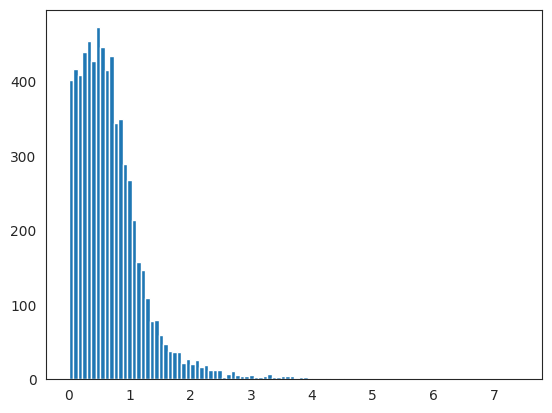

In [ ]:
# Elbow method for determining threshold cutoff
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

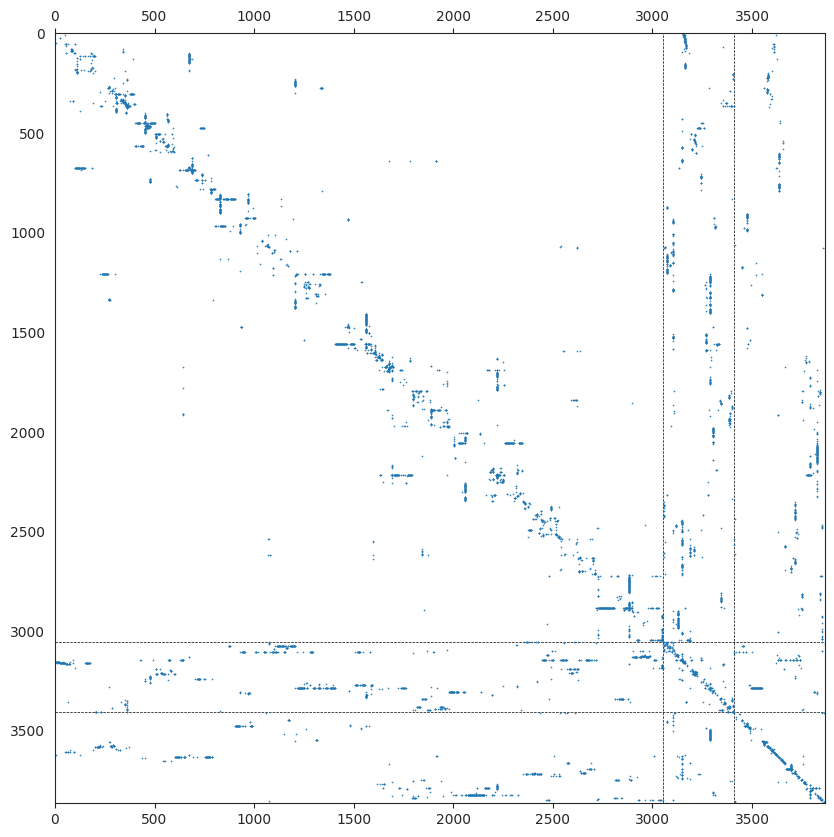

In [ ]:
# Sparse Adjacency Matrix for GossipCop Timeblock 1 using NOCD documentation
plt.figure(figsize=[10, 10])
thresh = 1

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Community summary statistics calculated using NOCD documentation
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# These metrics may be used to inform the number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [460 437 515]

Background (over the entire graph):
 - density    = 4.790e-04
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.2422
 - conductance = 0.7236
 - density     = 2.694e-03
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids for GossipCop (Timeblock 1)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [0.02826087 0.66086954 0.00286176 0.00177126 0.01449504 0.00322915
 0.0015214  0.3254852  0.1052665  0.14707384]

Verified?: 0.028
Enable geo-spatial positioning: 0.661
Followers count: 0.003
Friends count: 0.002
Status count: 0.014
Favorite count: 0.003
Number of lists: 0.002
Created time: 0.325
Number of words in desc: 0.105
Number of words in name: 0.147

Mean Vector for Community 1: [0.00686499 0.42334095 0.00045385 0.00207126 0.02248068 0.00659572
 0.00117355 0.30888212 0.11068913 0.19432624]

Verified?: 0.007
Enable geo-spatial positioning: 0.423
Followers count: 0.000
Friends count: 0.002
Status count: 0.022
Favorite count: 0.007
Number of lists: 0.001
Created time: 0.309
Number of words in desc: 0.111
Number of words in name: 0.194

Mean Vector for Community 2: [0.07184466 0.1223301  0.00114832 0.002253   0.02031417 0.00263846
 0.00230112 0.31545073 0.11269749 0.14719303]

Verified?: 0.072
Enable geo-spatial positioning: 0.122
Followers count: 0.001

In [ ]:
# Example of a particular user affiliation
Z_pred[0]

array([False, False,  True])

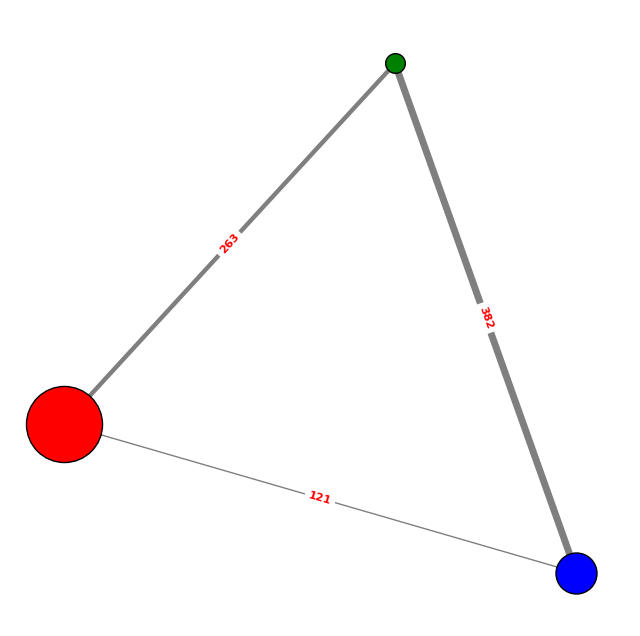

In [ ]:
# Overlapping Community Network of GossipCop (Timeblock 1)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

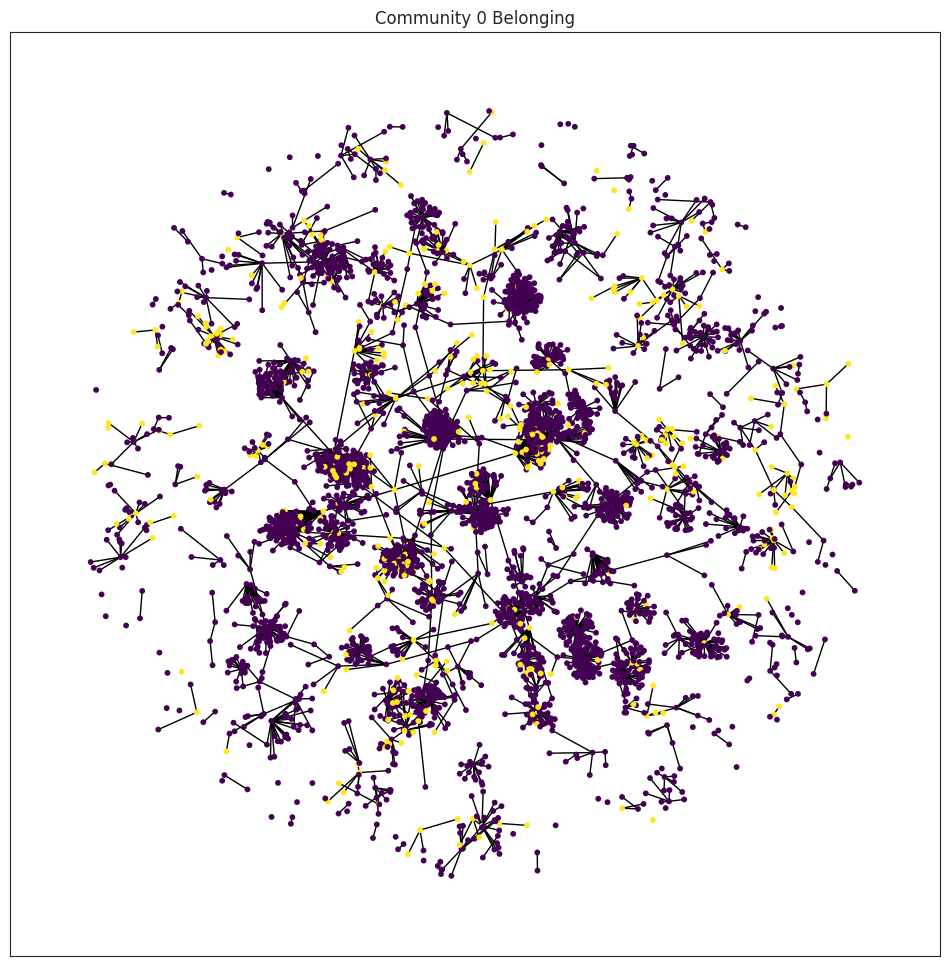

In [ ]:
# A particular community in GossipCop (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 0 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 0], with_labels=False, node_size=10)
plt.show()

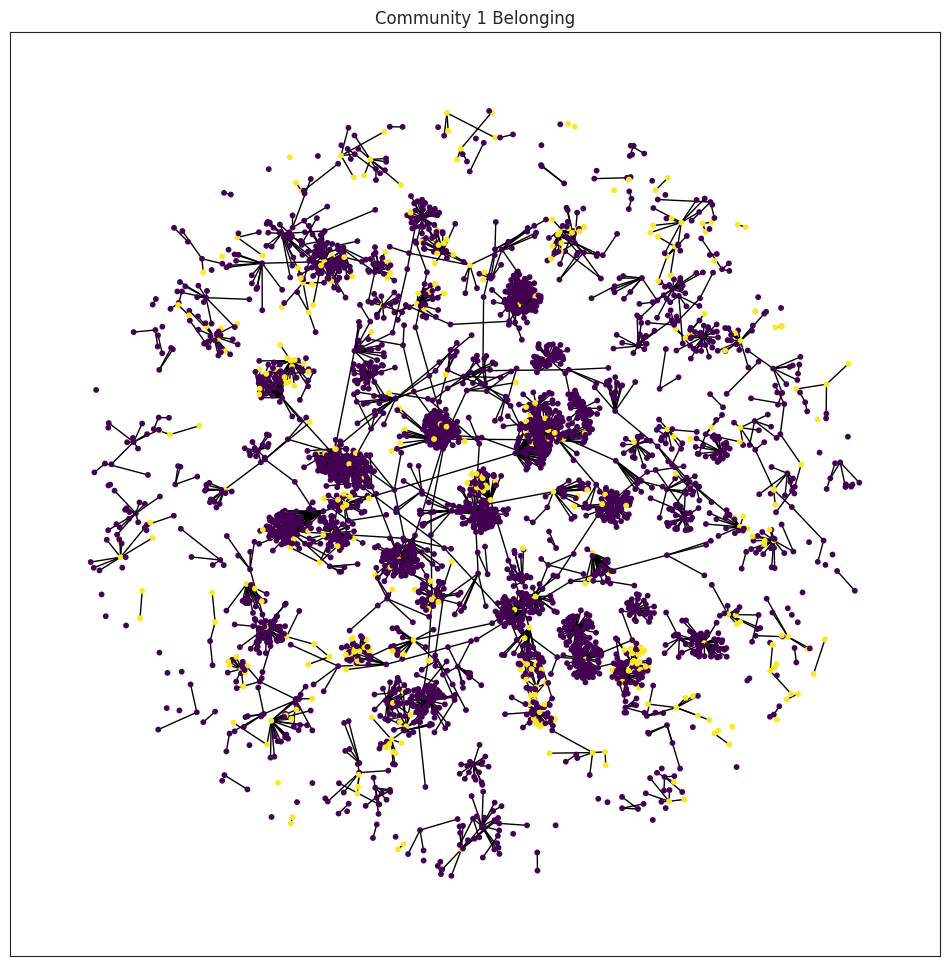

In [ ]:
# A particular community in GossipCop (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 1 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 1], with_labels=False, node_size=10)
plt.show()

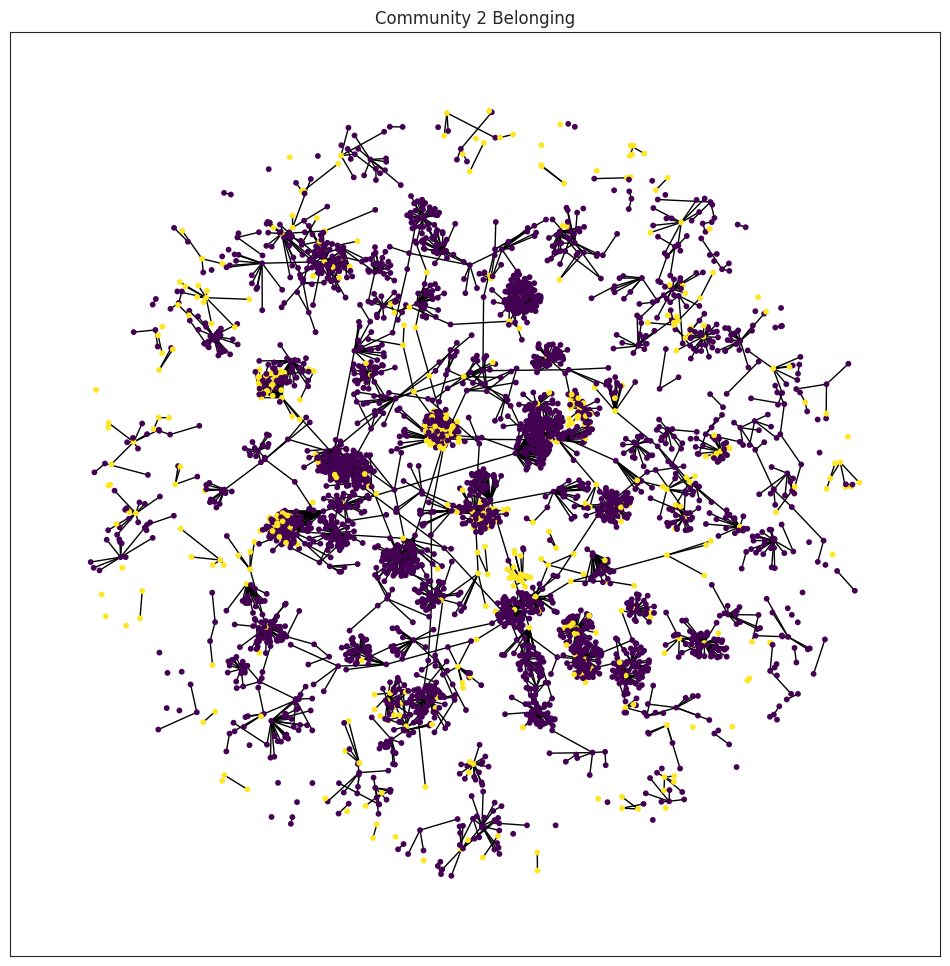

In [ ]:
# A particular community in GossipCop (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Community 2 Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=0, vmax=1, cmap=CMAP, node_color=Z_pred[:, 2], with_labels=False, node_size=10)
plt.show()

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

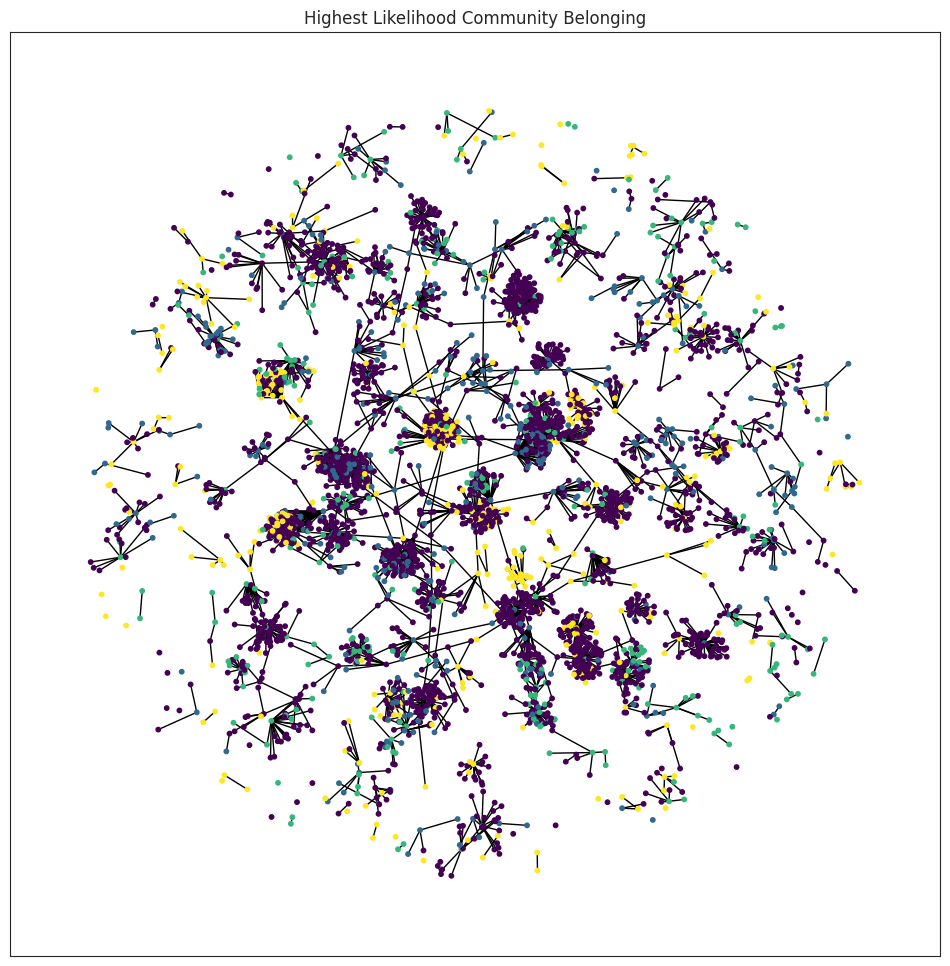

In [ ]:
# All communities in GossipCop (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=z)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("Highest Likelihood Community Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=min(colors), vmax=max(colors), cmap=CMAP, node_color=colors, with_labels=False, node_size=10)
plt.show()

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes))

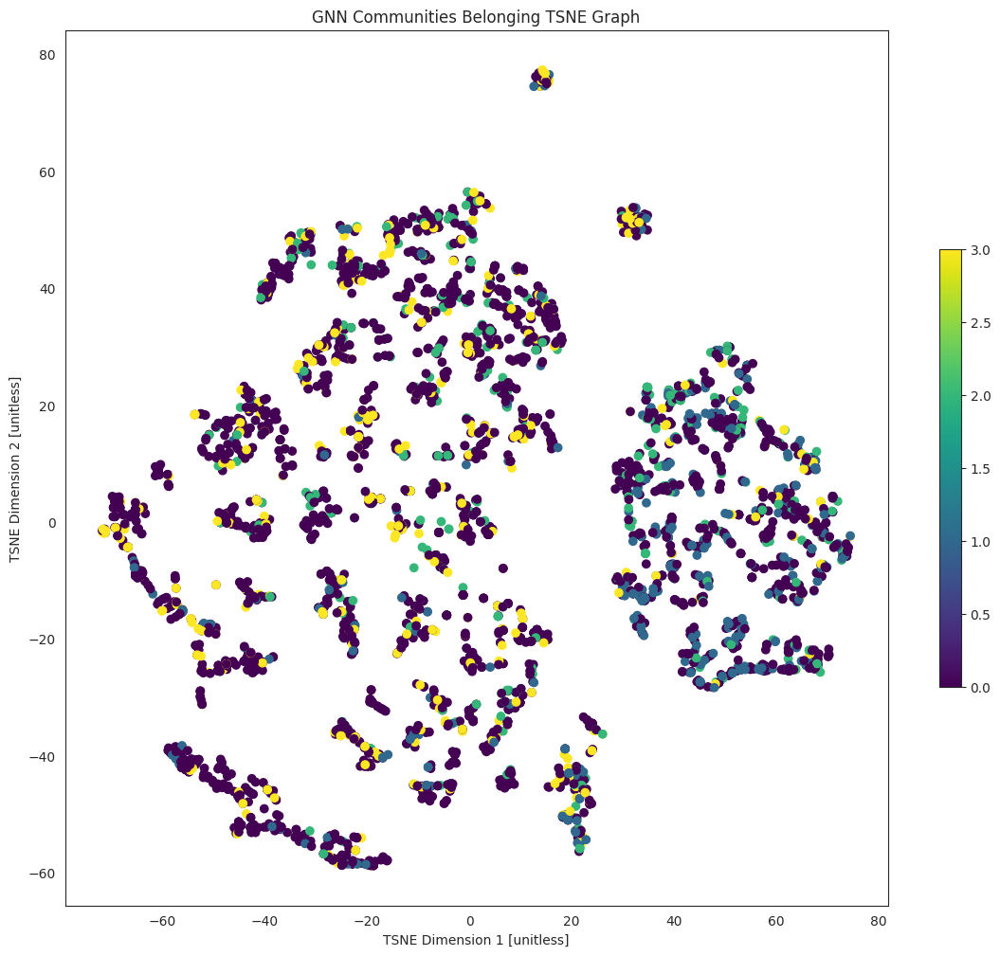

In [ ]:
# t-SNE plot of communities in GossipCop (Timeblock 1)
plt.figure(figsize=(14, 12))
plt.title("GNN Communities Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means GossipCop (Timeblock 1)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Cluster {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Cluster 0: [-5.4948032e-07 -8.3446503e-06  2.3721857e-04  1.5351544e-03
  2.0524183e-02  2.3628210e-03  6.3468405e-04  3.2288381e-01
  1.0602403e-01  1.3709851e-01]

Verified?: -0.000
Enable geo-spatial positioning: -0.000
Followers count: 0.000
Friends count: 0.002
Status count: 0.021
Favorite count: 0.002
Number of lists: 0.001
Created time: 0.323
Number of words in desc: 0.106
Number of words in name: 0.137

Mean Vector for Cluster 1: [2.60770321e-08 9.99992371e-01 2.60220258e-04 1.91570970e-03
 1.84974745e-02 4.25516907e-03 5.94798883e-04 2.90430963e-01
 1.10342726e-01 1.69245020e-01]

Verified?: 0.000
Enable geo-spatial positioning: 1.000
Followers count: 0.000
Friends count: 0.002
Status count: 0.018
Favorite count: 0.004
Number of lists: 0.001
Created time: 0.290
Number of words in desc: 0.110
Number of words in name: 0.169

Mean Vector for Cluster 2: [0.9999993  0.6117648  0.02686262 0.00587592 0.02835433 0.00391647
 0.02557925 0.20870267 0.11960784 0.22629759]


In [ ]:
# Feature Importance in K-Means GossipCop (Timeblock 1)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Enable geo-spatial positioning: 9.63
Verified?: 8.88
Created time: 3.24
Number of words in name: 2.42
Followers count: 0.12
Number of lists: 0.11
Number of words in desc: 0.04
Status count: 0.02
Favorite count: 0.01
Friends count: 0.0


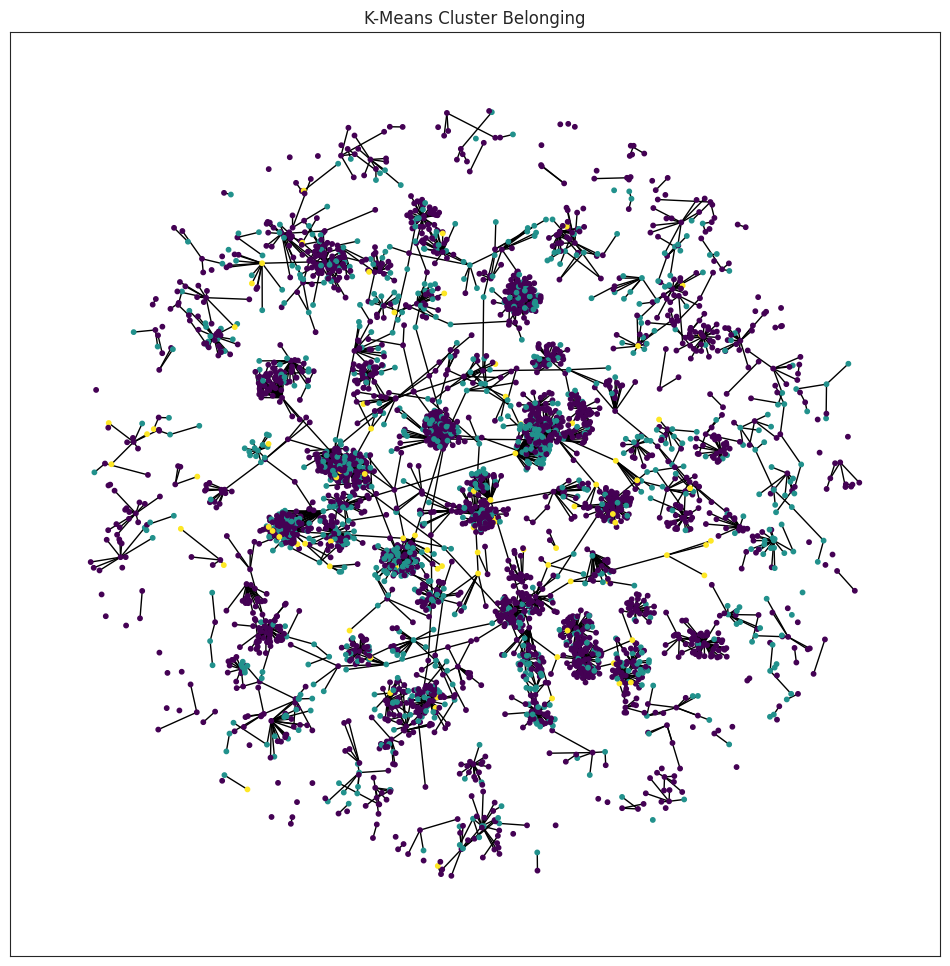

In [ ]:
# Visualization of clusters in GossipCop (Timeblock 1)
G = pg.data.Data(x=nodes, edge_index=edge_index, y=kmeans.labels_)
graph = pg.utils.to_networkx(G, to_undirected=True)
plt.figure(figsize=(12, 12))

CMAP = plt.get_cmap("viridis")
plt.title("K-Means Cluster Belonging")
nx.draw_networkx(graph, pos=nx.spring_layout(graph, seed=SEED), vmin=min(kmeans.labels_), vmax=max(kmeans.labels_), cmap=CMAP, node_color=kmeans.labels_, with_labels=False, node_size=10)
plt.show()

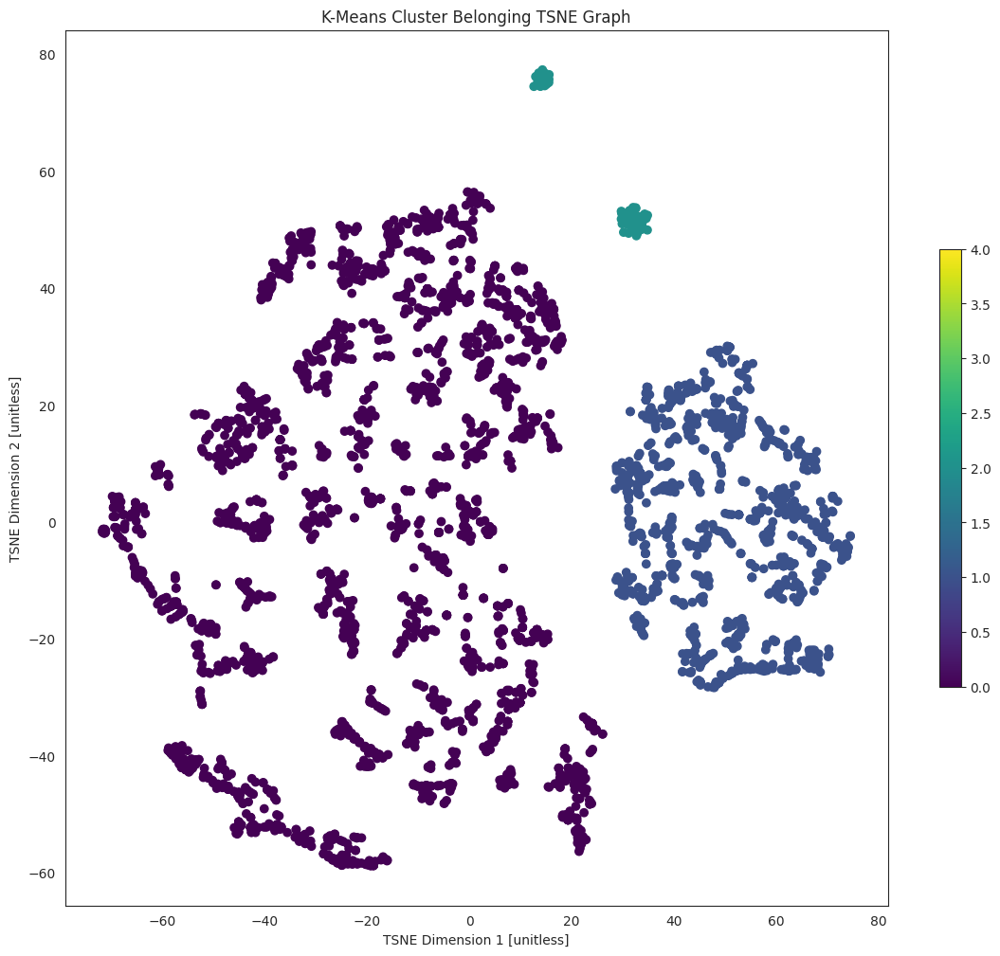

In [ ]:
# t-SNE plot of clusters in GossipCop (Timeblock 1)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(14, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**Timeblock 2**

In [ ]:
timeblock = timeblock2
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = True  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[24252, 10], edge_index=[2, 46736], y=[1], t=[24252])
Epoch    0, loss.full = 2.4683
Epoch   25, loss.full = 0.9613
Epoch   50, loss.full = 0.8582
Epoch   75, loss.full = 0.7901
Epoch  100, loss.full = 0.7802
Epoch  125, loss.full = 0.6925
Epoch  150, loss.full = 0.6852
Epoch  175, loss.full = 0.6592
Epoch  200, loss.full = 0.6335
Epoch  225, loss.full = 0.5974
Epoch  250, loss.full = 0.5843
Epoch  275, loss.full = 0.5871
Epoch  300, loss.full = 0.4901
Epoch  325, loss.full = 0.4998
Epoch  350, loss.full = 0.4815
Epoch  375, loss.full = 0.4792
Epoch  400, loss.full = 0.4583
Epoch  425, loss.full = 0.4557
Epoch  450, loss.full = 0.4376
Epoch  475, loss.full = 0.4255
Epoch  500, loss.full = 0.4215


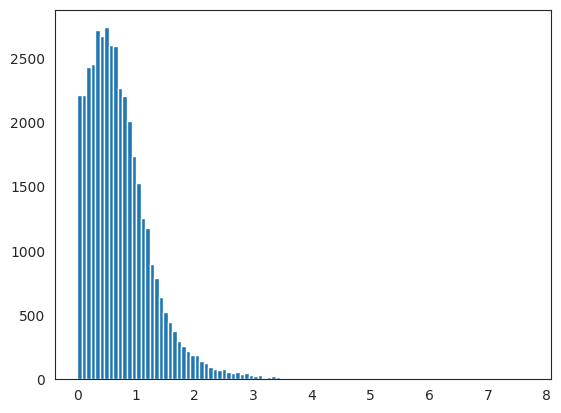

In [ ]:
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

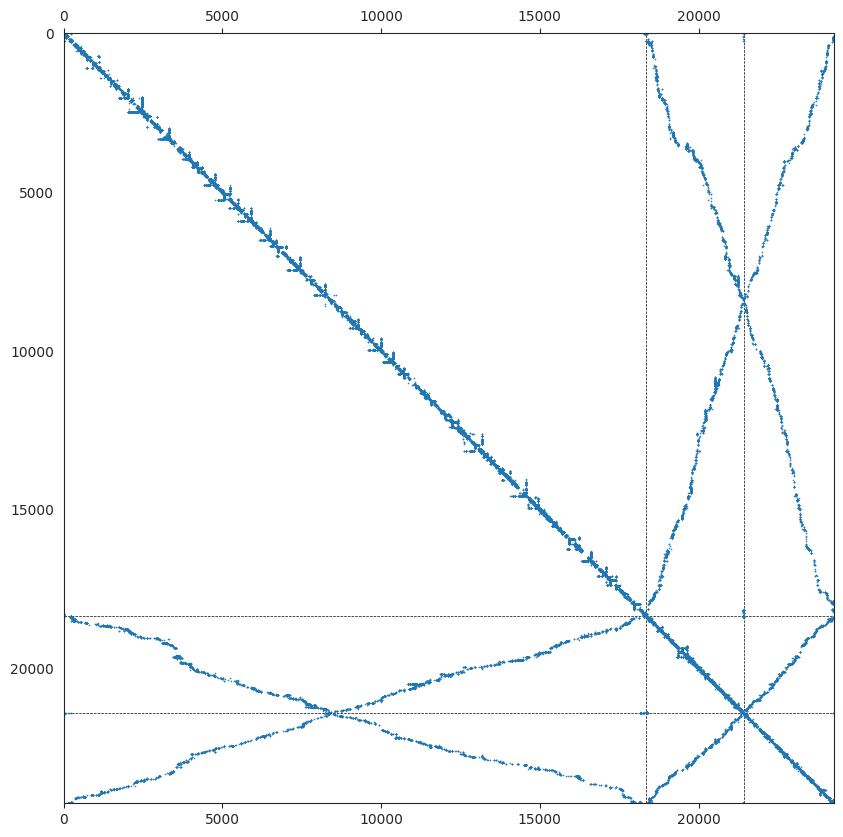

In [ ]:
# Sparse Adjacency Matrix for GossipCop Timeblock 2 using NOCD documentation
plt.figure(figsize=[10, 10])
thresh = 1

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Community summary statistics for GossipCop Timeblock 2 using NOCD documentation
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# Metrics to evaluate number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [3416 3288 3224]

Background (over the entire graph):
 - density    = 7.946e-05
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.3045
 - conductance = 0.6441
 - density     = 4.425e-04
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids of GossipCop (Timeblock 2)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [0.01785714 0.06352459 0.00079669 0.00288702 0.0461731  0.00593866
 0.00166405 0.45550165 0.11310156 0.13485928]

Verified?: 0.018
Enable geo-spatial positioning: 0.064
Followers count: 0.001
Friends count: 0.003
Status count: 0.046
Favorite count: 0.006
Number of lists: 0.002
Created time: 0.456
Number of words in desc: 0.113
Number of words in name: 0.135

Mean Vector for Community 1: [0.13351582 0.44403893 0.00327016 0.00265662 0.02760744 0.00971069
 0.00453415 0.35900572 0.11968042 0.18790016]

Verified?: 0.134
Enable geo-spatial positioning: 0.444
Followers count: 0.003
Friends count: 0.003
Status count: 0.028
Favorite count: 0.010
Number of lists: 0.005
Created time: 0.359
Number of words in desc: 0.120
Number of words in name: 0.188

Mean Vector for Community 2: [0.07444169 0.58901983 0.00407556 0.00216101 0.02577178 0.0105451
 0.00480001 0.44797903 0.10166731 0.14495401]

Verified?: 0.074
Enable geo-spatial positioning: 0.589
Followers count: 0.004


In [ ]:
# Example of a particular user affiliation
Z_pred[0]

array([False,  True, False])

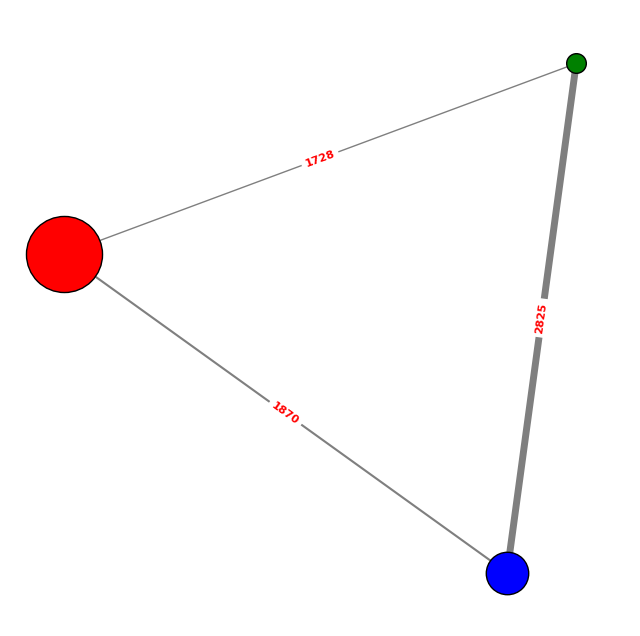

In [ ]:
# Overlapping Community Network of GossipCop (Timeblock 2)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes))

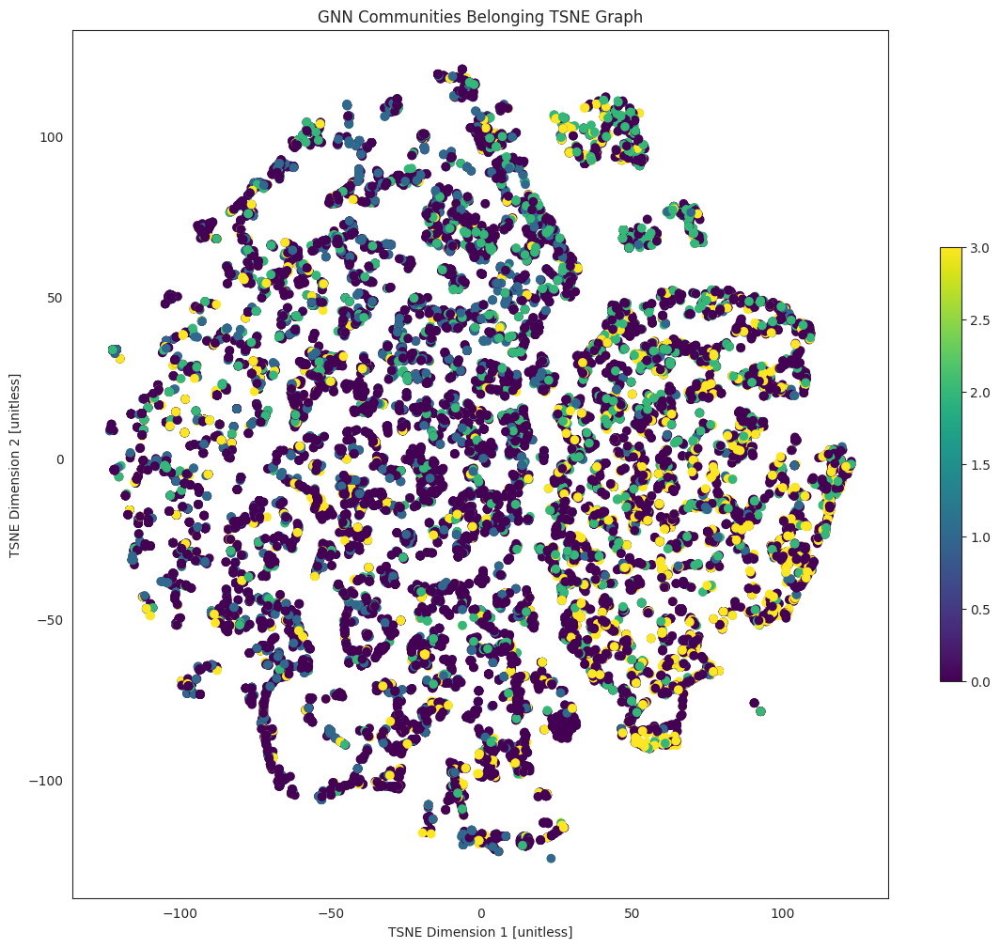

In [ ]:
# t-SNE plot of communities in GossipCop (timeblock 2)
plt.figure(figsize=(14, 12))
plt.title("GNN Communities Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means GossipCop (Timeblock 2)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Cluster {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Cluster 0: [-5.6885183e-06 -2.2292137e-05  3.5627588e-04  2.1809482e-03
  3.2773364e-02  4.8181871e-03  9.2433800e-04  4.7985733e-01
  1.0919008e-01  1.4747246e-01]

Verified?: -0.000
Enable geo-spatial positioning: -0.000
Followers count: 0.000
Friends count: 0.002
Status count: 0.033
Favorite count: 0.005
Number of lists: 0.001
Created time: 0.480
Number of words in desc: 0.109
Number of words in name: 0.147

Mean Vector for Cluster 1: [3.0286610e-06 9.9998593e-01 2.7506327e-04 2.2950252e-03 2.9658915e-02
 1.1814035e-02 8.3239179e-04 3.9605477e-01 1.1142413e-01 1.7483455e-01]

Verified?: 0.000
Enable geo-spatial positioning: 1.000
Followers count: 0.000
Friends count: 0.002
Status count: 0.030
Favorite count: 0.012
Number of lists: 0.001
Created time: 0.396
Number of words in desc: 0.111
Number of words in name: 0.175

Mean Vector for Cluster 2: [0.9999898  0.5094495  0.01994225 0.0050472  0.03817489 0.00573612
 0.02535141 0.22251436 0.11455034 0.1785371 ]

Verified?:

In [ ]:
# Feature Importance in K-Means GossipCop (Timeblock 2)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Created time: 184.47
Verified?: 115.28
Enable geo-spatial positioning: 82.98
Number of words in name: 8.44
Number of lists: 1.26
Followers count: 0.81
Favorite count: 0.5
Status count: 0.21
Number of words in desc: 0.09
Friends count: 0.02


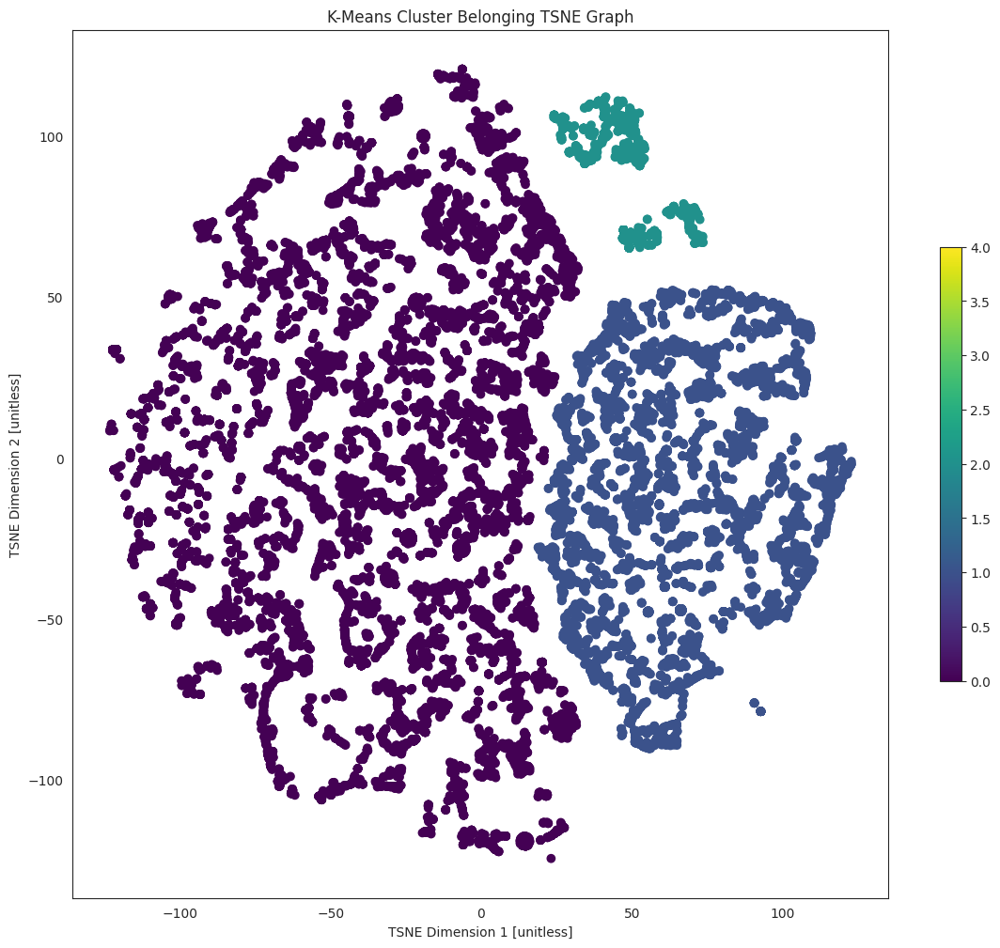

In [ ]:
# t-SNE plot of clusters in GossipCop (Timeblock 2)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(14, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_)
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**Timeblock 3**

In [ ]:
timeblock = timeblock3
print(timeblock)
X = csr_matrix(timeblock.x)
edge_index = timeblock.edge_index
A = to_scipy_sparse_matrix(edge_index).tocsr()
Z = None

N = X.shape[0] # Num nodes
K = 3 # Num communities

hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = True  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 25 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
            print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}')

            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break

    # Training step
    gnn.train()
    opt.zero_grad()
    Z = torch.nn.functional.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Data(x=[314249, 10], edge_index=[2, 617058], y=[1], t=[314249])
Epoch    0, loss.full = 2.3600
Epoch   25, loss.full = 1.6414
Epoch   50, loss.full = 0.8718
Epoch   75, loss.full = 0.7620
Epoch  100, loss.full = 0.7102
Epoch  125, loss.full = 0.5870
Epoch  150, loss.full = 0.5745
Epoch  175, loss.full = 0.5737
Epoch  200, loss.full = 0.5528
Epoch  225, loss.full = 0.5966
Epoch  250, loss.full = 0.5343
Epoch  275, loss.full = 0.5149
Epoch  300, loss.full = 0.5215
Epoch  325, loss.full = 0.5461
Epoch  350, loss.full = 0.5434
Epoch  375, loss.full = 0.4937
Epoch  400, loss.full = 0.4562
Epoch  425, loss.full = 0.5186
Epoch  450, loss.full = 0.5858
Epoch  475, loss.full = 0.4510
Epoch  500, loss.full = 0.4300


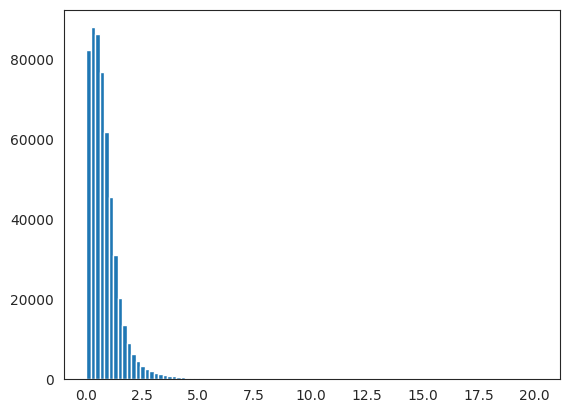

In [ ]:
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

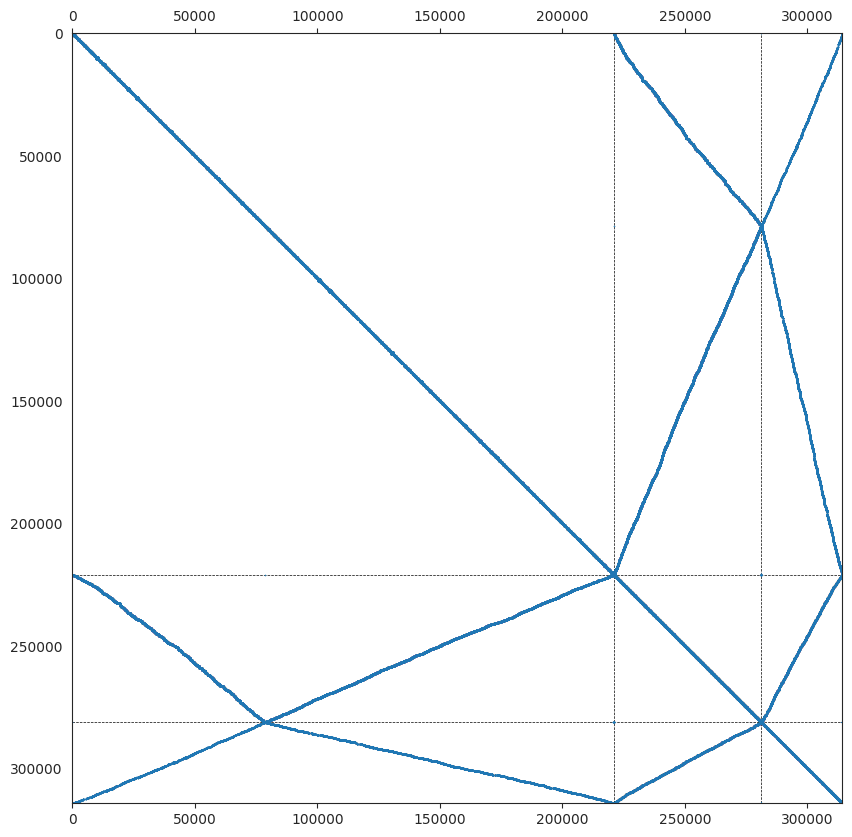

In [ ]:
# Sparse Adjacency Matrix for GossipCop Timeblock 3 using NOCD documentation
plt.figure(figsize=[10, 10])
thresh = 1

Z_pred = Z.cpu().detach().numpy() > thresh
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=0.25)

In [ ]:
# Summary metrics for GossipCop Timeblock 3 using NOCD documentation
print(f'Community Sizes: {Z_pred.sum(0)}')
print()

density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')
print()

# Metrics can be used to inform number of communities
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Community Sizes: [40373 67037 40730]

Background (over the entire graph):
 - density    = 6.249e-06
 - clust_coef = 0.000e+00

Predicted communities:
 - coverage    = 0.3633
 - conductance = 0.6071
 - density     = 3.161e-05
 - clust_coef  = 0.000e+00


In [ ]:
# Community centroids of GossipCop (Timeblock 3)
nodes = X.todense()
coms = []
for c in range(K):
  indices = Z_pred[:, c] # Z_pred is True/False community-belonging
  vectors = nodes[indices]
  coms.append(np.where(indices)[0].tolist())
  community_mean = np.array(np.mean(vectors, 0)).squeeze()
  print(f"Mean Vector for Community {c}: {community_mean}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(community_mean[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [0.13528843 0.62744904 0.01163317 0.00559889 0.03132824 0.01735986
 0.00996443 0.44274244 0.11500495 0.1813532 ]

Verified?: 0.135
Enable geo-spatial positioning: 0.627
Followers count: 0.012
Friends count: 0.006
Status count: 0.031
Favorite count: 0.017
Number of lists: 0.010
Created time: 0.443
Number of words in desc: 0.115
Number of words in name: 0.181

Mean Vector for Community 1: [0.02662709 0.32012174 0.00347883 0.00387397 0.05175512 0.0086439
 0.00345044 0.5308122  0.11306097 0.17063904]

Verified?: 0.027
Enable geo-spatial positioning: 0.320
Followers count: 0.003
Friends count: 0.004
Status count: 0.052
Favorite count: 0.009
Number of lists: 0.003
Created time: 0.531
Number of words in desc: 0.113
Number of words in name: 0.171

Mean Vector for Community 2: [0.08367297 0.11964154 0.00316433 0.00245437 0.03011683 0.00673675
 0.00338277 0.60339147 0.1106798  0.13706435]

Verified?: 0.084
Enable geo-spatial positioning: 0.120
Followers count: 0.003


In [ ]:
# Example of particular user affiliations
Z_pred[0]

array([False,  True,  True])

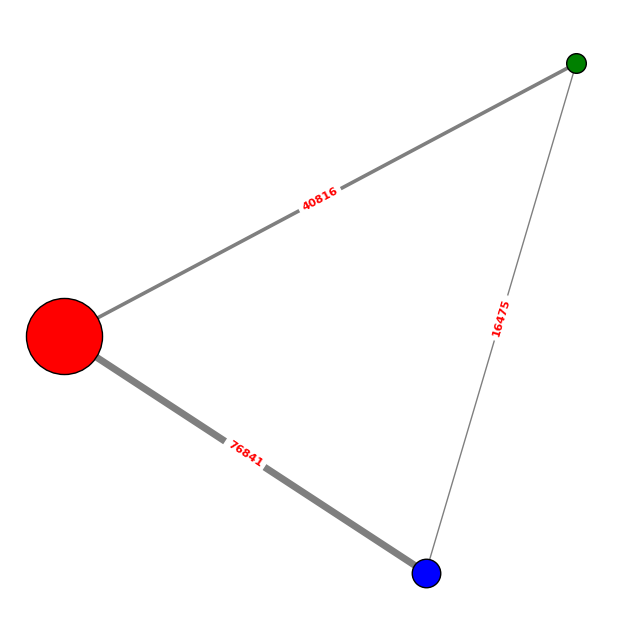

In [ ]:
# Overlapping Community Network of GossipCop (Timeblock 3)
# Consulted: https://cdlib.readthedocs.io/en/latest/reference/generated/cdlib.viz.plot_community_graph.html#cdlib.viz.plot_community_graph
g = pg.utils.to_networkx(timeblock)
nodeclustering = NodeClustering(communities=coms, graph=g, overlap=True)
viz.plot_community_graph(g, nodeclustering, plot_overlaps=True)

In [ ]:
colors = np.zeros(len(z))
for c, members in enumerate(coms):
  for m in members:
    colors[m] = z[m] + 1

In [ ]:
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE()
X_embedded = tsne.fit_transform(np.asarray(nodes)[:30000])

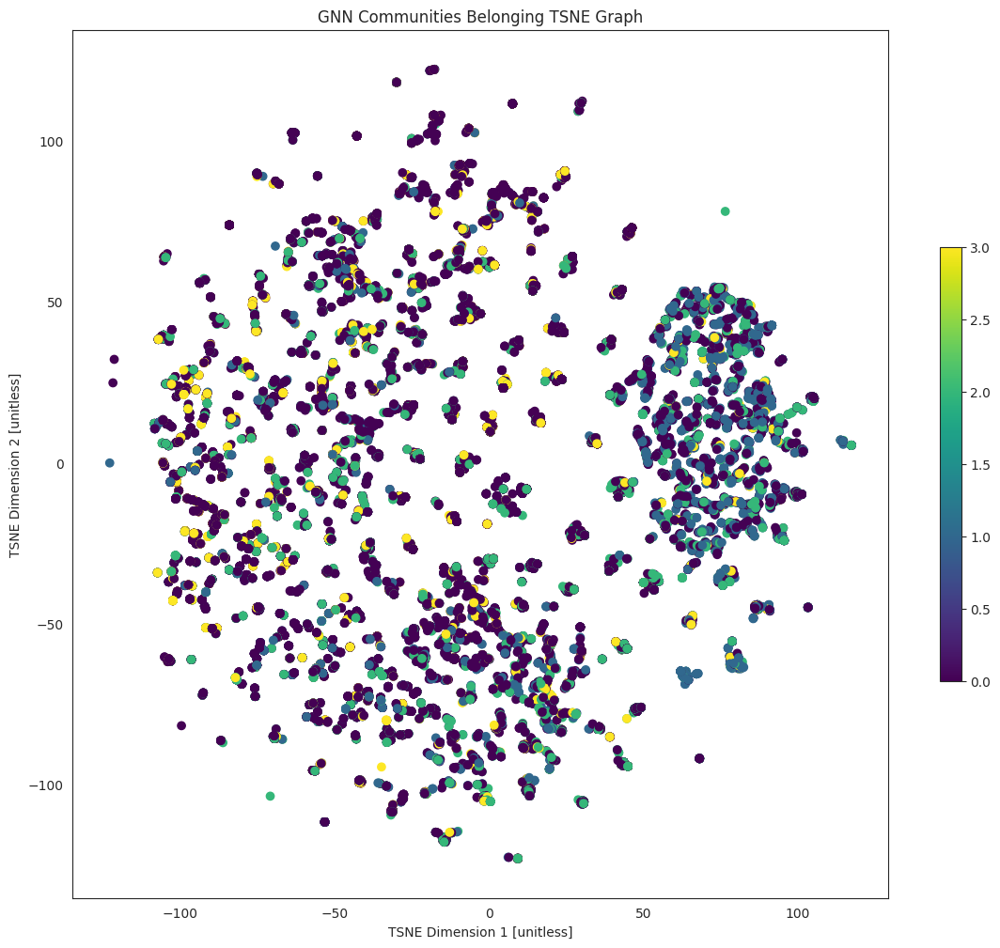

In [ ]:
# t-SNE plot of communities in GossipCop (Timeblock 3)
plt.figure(figsize=(14, 12))
plt.title("GNN Communities Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=min(colors), vmax=max(colors), cmap=CMAP, c=colors[:30000])
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()

**K-Means Comparison**

In [ ]:
# Cluster centroids in K-Means GossipCop (Timeblock 3)
X = np.asarray(csr_matrix(timeblock.x).todense())
kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto").fit(X)
for i, v in enumerate(kmeans.cluster_centers_):
  print(f"Mean Vector for Community {i}: {v}\n")
  for idx, feature in enumerate(features):
    print(f'{feature}: {np.round(v[idx], 3):.3f}')
  print()

Mean Vector for Community 0: [3.50460410e-04 2.25603580e-05 3.39828432e-04 1.41409424e-03
 2.53015477e-02 3.13368114e-03 4.28459607e-04 7.58248389e-01
 1.06742956e-01 1.21391349e-01]

Verified?: 0.000
Enable geo-spatial positioning: 0.000
Followers count: 0.000
Friends count: 0.001
Status count: 0.025
Favorite count: 0.003
Number of lists: 0.000
Created time: 0.758
Number of words in desc: 0.107
Number of words in name: 0.121

Mean Vector for Community 1: [0.08146685 1.0000226  0.00681762 0.00495329 0.0407539  0.01580214
 0.00594502 0.43003276 0.11541174 0.17882973]

Verified?: 0.081
Enable geo-spatial positioning: 1.000
Followers count: 0.007
Friends count: 0.005
Status count: 0.041
Favorite count: 0.016
Number of lists: 0.006
Created time: 0.430
Number of words in desc: 0.115
Number of words in name: 0.179

Mean Vector for Community 2: [6.35850281e-02 2.22623348e-05 1.79836201e-03 3.46806645e-03
 5.35827614e-02 8.18219502e-03 2.93868757e-03 3.89363617e-01
 1.17358014e-01 1.79598376e-

In [ ]:
# Feature Importance in K-Means GossipCop (Timeblock 3)
results = permutation_importance(kmeans, X, None, scoring=None)
importance = results.importances_mean
indices = np.argsort(-importance)
for i in indices:
  print(f"{features[i]}: {np.round(importance[i], 2)}")

Created time: 3579.08
Enable geo-spatial positioning: 3167.62
Verified?: 672.84
Number of words in name: 460.64
Status count: 86.57
Favorite count: 17.23
Number of words in desc: 15.39
Followers count: 4.82
Number of lists: 2.88
Friends count: 1.57


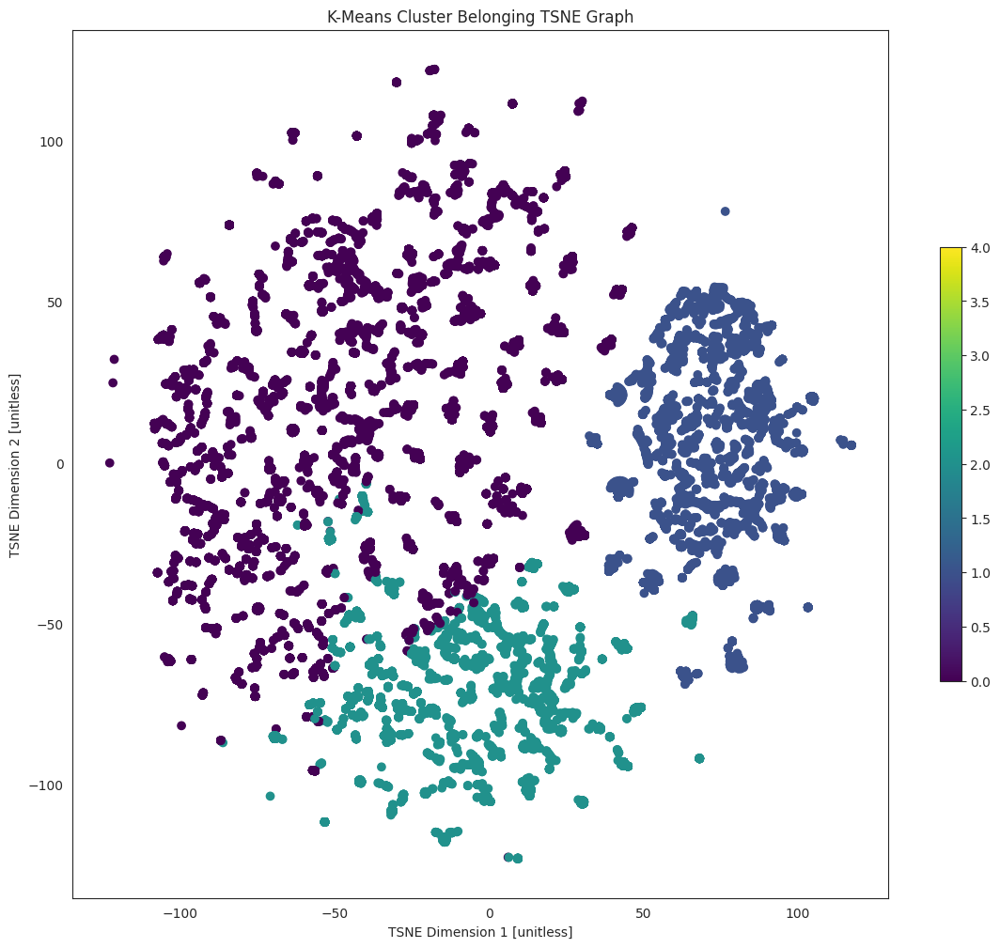

In [ ]:
# t-SNE plot of clusters in GossipCop (Timeblock 3)
# Consulted: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
plt.figure(figsize=(14, 12))
plt.title("K-Means Cluster Belonging TSNE Graph")
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], vmin=0, vmax=4, cmap=CMAP, c=kmeans.labels_[:30000])
plt.xlabel("TSNE Dimension 1 [unitless]")
plt.ylabel("TSNE Dimension 2 [unitless]")
plt.colorbar(shrink=0.5)
plt.show()